In [2]:
''' This script trains a score-based model to learn a score function without the built-in singularity.'''

## Importing necessary libraries
import torch, random, shutil, os, numpy as np, torch.nn as nn
import matplotlib.pyplot as plt
from ema_pytorch import EMA

device = 'cuda' if torch.cuda.is_available() else 'cpu'

# Setting up the plotting parameters
plt.rcParams.update({"text.usetex": True,"font.family": "sans-serif",'font.size': 18})

## Load data

<Figure size 200x200 with 0 Axes>

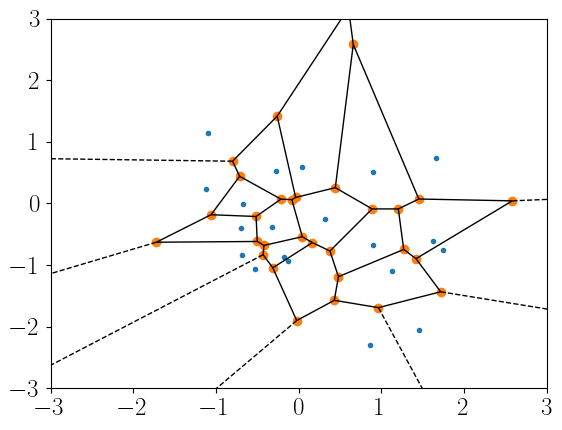

In [3]:
# Set seed manually for reproducibility
random.seed(1)
np.random.seed(1)
torch.manual_seed(0)
torch.cuda.manual_seed(0)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

# Load data
data = torch.from_numpy(np.load("training_data.npy")).float()
N = data.shape[0]
dim = data.shape[1]

# plot data
from scipy.spatial import Voronoi, voronoi_plot_2d
vor = Voronoi(data)
plt.figure(figsize=(2,2))
fig = voronoi_plot_2d(vor)
plt.xlim(-3,3)
plt.ylim(-3,3)
plt.show()

## Define model

In [4]:
class GaussianFourierProjection(nn.Module):
    """Gaussian random features for encoding time steps."""  
    def __init__(self, embed_dim, scale=30.):
        super().__init__()
        self.W = nn.Parameter(torch.randn(embed_dim // 2) * scale, requires_grad=False)
    def forward(self, x):
        x_proj = x[:, None] * self.W[None, :] * 2 * np.pi
        return torch.cat([torch.sin(x_proj), torch.cos(x_proj)], dim=-1)

class score_edm(torch.nn.Module):
    '''
        Neural network to learn the score function
        Results in the paper use the default settings of width=256, depth=2, activation=ReLU
    '''
    def __init__(self, device, width=256, depth=2, embed_dim=8, activation=nn.ReLU, schedule=None):
        super().__init__()
        
        self.width = width
        self.depth = depth
        self.activation = activation()
        self.embed = GaussianFourierProjection(embed_dim, scale=1.0)
        net = []
        net.append(nn.Linear(2+embed_dim,self.width))
        net.append(self.activation)
        for _ in range(self.depth):
            net.append(nn.Linear(self.width,self.width))
            net.append(self.activation)
        net.append(nn.Linear(self.width,2))
        self.net = nn.Sequential(*net).to(device=device)
        
    def forward(self, x, t):
        embed = self.embed(t.squeeze())
        x_in = torch.cat([x, embed], dim=-1)
        score = self.net(x_in).to(torch.float32)
        return score
    
def loss_func(net, X, schedule):
    '''
        Denoising score matching loss function (un-regularized)
    '''
    t = torch.rand([X.shape[0], 1], device=X.device)
    noise = torch.randn_like(X) 
    mean = (schedule.marginal_prob_mean(t)).to(X.device)
    std  = (schedule.marginal_prob_std(t)).to(X.device)
    x_tilde = mean * X + std * noise
    score = net(x_tilde, t)
    loss = torch.mean((std*score + noise)**2, dim=(1))
    return loss.mean()

from score_models import GMM_score, VE, VP

# Training parameters
n_epochs        = 300000 # maximum number of total epochs
lr              = 1e-3   # learning rate
width           = 256    # Width of the score network 
depth           = 2      # Depth of the score network
plot_every      = 5000   # Plotting interval
embed_dim       = 8      # Dimension of the time embedding
path_to_save    = './experiments/vary_epochs/'
figures_path    = './figures/VP_NN_VaryEpochs/'

# define schedule
schedule = VP()
#schedule = VE()

## Train network

epoch: 1000, loss: 0.5056591033935547


/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  res_loc = torch.tensor(samples_x, device=latents.device, dtype=torch.float32).reshape(lat_shape)
/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  dist = torch.sqrt(torch.sum((final_samples[i,:] - torch.tensor(data, dtype=torch.float32))**2, axis=1))


Number of samples that are close to the data:  0.0


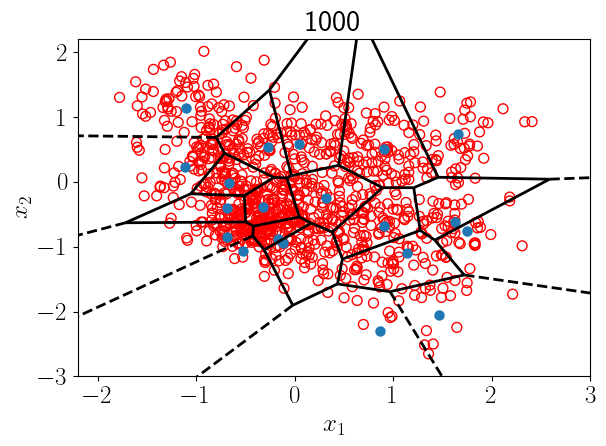

epoch: 1098, loss: 0.7883020639419556


/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  res_loc = torch.tensor(samples_x, device=latents.device, dtype=torch.float32).reshape(lat_shape)
/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  dist = torch.sqrt(torch.sum((final_samples[i,:] - torch.tensor(data, dtype=torch.float32))**2, axis=1))


Number of samples that are close to the data:  0.001


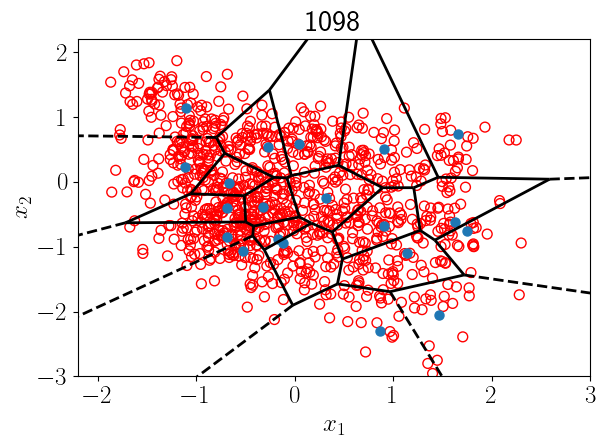

epoch: 1206, loss: 0.48609766364097595


/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  res_loc = torch.tensor(samples_x, device=latents.device, dtype=torch.float32).reshape(lat_shape)
/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  dist = torch.sqrt(torch.sum((final_samples[i,:] - torch.tensor(data, dtype=torch.float32))**2, axis=1))


Number of samples that are close to the data:  0.001


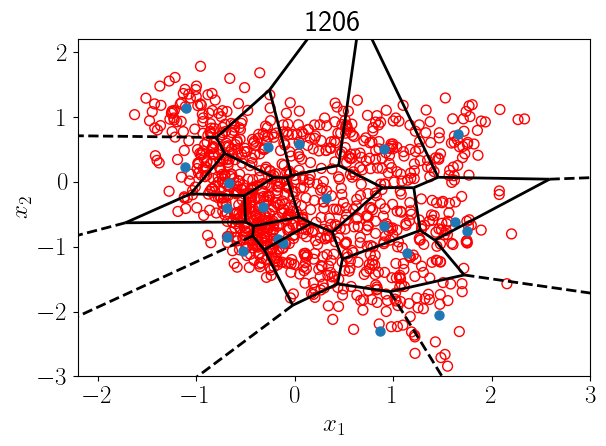

epoch: 1325, loss: 0.6433410048484802


/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  res_loc = torch.tensor(samples_x, device=latents.device, dtype=torch.float32).reshape(lat_shape)
/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  dist = torch.sqrt(torch.sum((final_samples[i,:] - torch.tensor(data, dtype=torch.float32))**2, axis=1))


Number of samples that are close to the data:  0.0


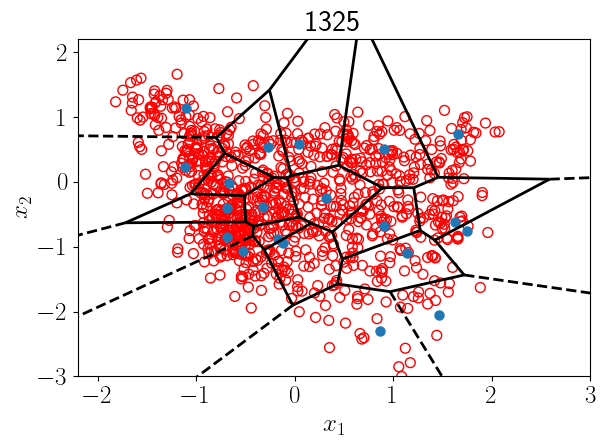

epoch: 1456, loss: 0.6348688006401062


/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  res_loc = torch.tensor(samples_x, device=latents.device, dtype=torch.float32).reshape(lat_shape)
/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  dist = torch.sqrt(torch.sum((final_samples[i,:] - torch.tensor(data, dtype=torch.float32))**2, axis=1))


Number of samples that are close to the data:  0.0


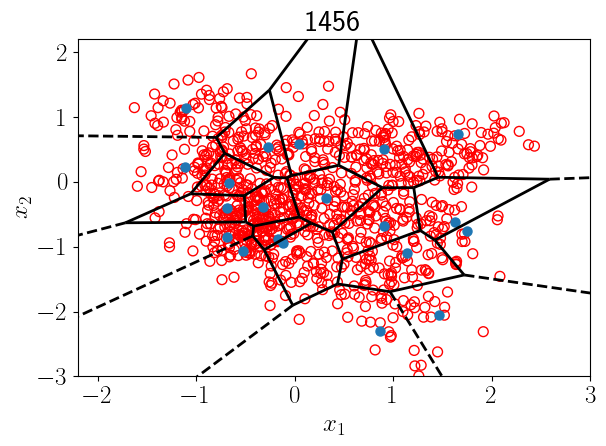

epoch: 1599, loss: 0.820835292339325


/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  res_loc = torch.tensor(samples_x, device=latents.device, dtype=torch.float32).reshape(lat_shape)
/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  dist = torch.sqrt(torch.sum((final_samples[i,:] - torch.tensor(data, dtype=torch.float32))**2, axis=1))


Number of samples that are close to the data:  0.0


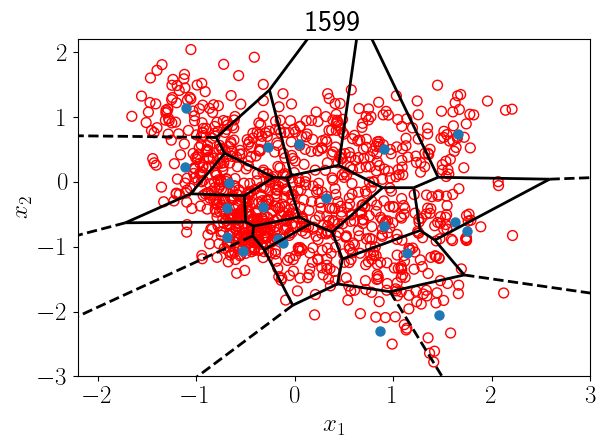

epoch: 1757, loss: 0.5515322685241699


/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  res_loc = torch.tensor(samples_x, device=latents.device, dtype=torch.float32).reshape(lat_shape)
/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  dist = torch.sqrt(torch.sum((final_samples[i,:] - torch.tensor(data, dtype=torch.float32))**2, axis=1))


Number of samples that are close to the data:  0.0


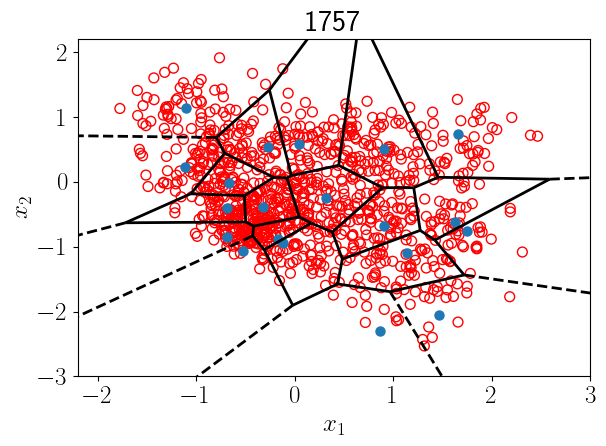

epoch: 1930, loss: 0.4852510392665863


/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  res_loc = torch.tensor(samples_x, device=latents.device, dtype=torch.float32).reshape(lat_shape)
/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  dist = torch.sqrt(torch.sum((final_samples[i,:] - torch.tensor(data, dtype=torch.float32))**2, axis=1))


Number of samples that are close to the data:  0.0


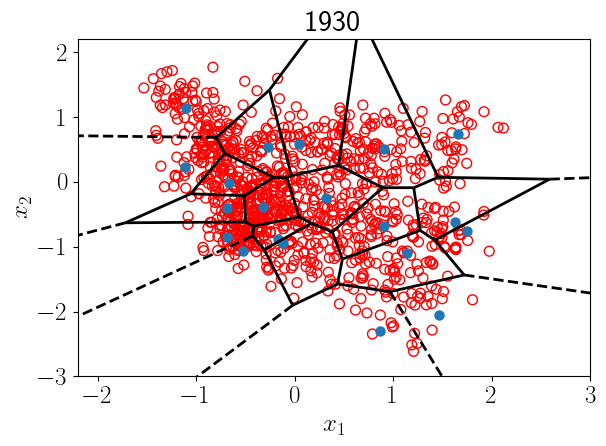

epoch: 2120, loss: 0.5013577342033386


/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  res_loc = torch.tensor(samples_x, device=latents.device, dtype=torch.float32).reshape(lat_shape)
/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  dist = torch.sqrt(torch.sum((final_samples[i,:] - torch.tensor(data, dtype=torch.float32))**2, axis=1))


Number of samples that are close to the data:  0.001


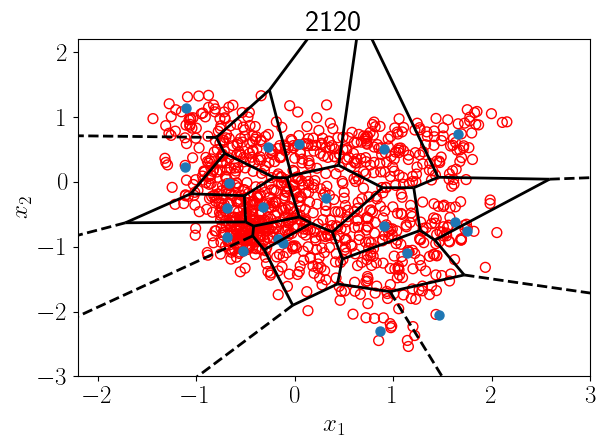

epoch: 2329, loss: 0.4585147500038147


/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  res_loc = torch.tensor(samples_x, device=latents.device, dtype=torch.float32).reshape(lat_shape)
/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  dist = torch.sqrt(torch.sum((final_samples[i,:] - torch.tensor(data, dtype=torch.float32))**2, axis=1))


Number of samples that are close to the data:  0.0


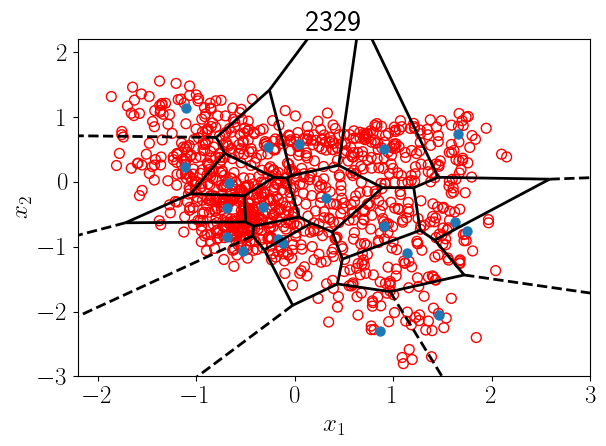

epoch: 2559, loss: 0.7633171081542969


/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  res_loc = torch.tensor(samples_x, device=latents.device, dtype=torch.float32).reshape(lat_shape)
/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  dist = torch.sqrt(torch.sum((final_samples[i,:] - torch.tensor(data, dtype=torch.float32))**2, axis=1))


Number of samples that are close to the data:  0.0


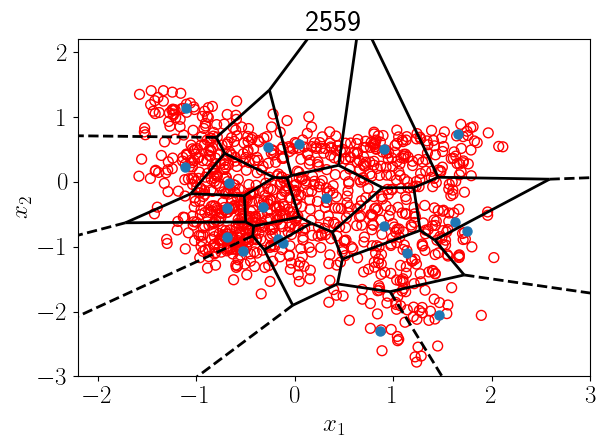

epoch: 2811, loss: 0.6053541898727417


/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  res_loc = torch.tensor(samples_x, device=latents.device, dtype=torch.float32).reshape(lat_shape)
/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  dist = torch.sqrt(torch.sum((final_samples[i,:] - torch.tensor(data, dtype=torch.float32))**2, axis=1))


Number of samples that are close to the data:  0.001


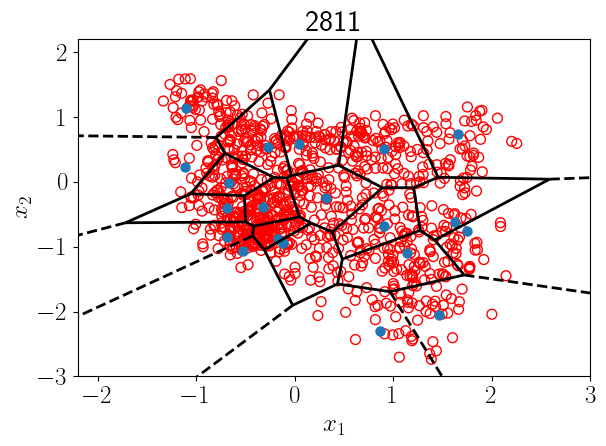

epoch: 3088, loss: 0.5144269466400146


/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  res_loc = torch.tensor(samples_x, device=latents.device, dtype=torch.float32).reshape(lat_shape)
/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  dist = torch.sqrt(torch.sum((final_samples[i,:] - torch.tensor(data, dtype=torch.float32))**2, axis=1))


Number of samples that are close to the data:  0.0


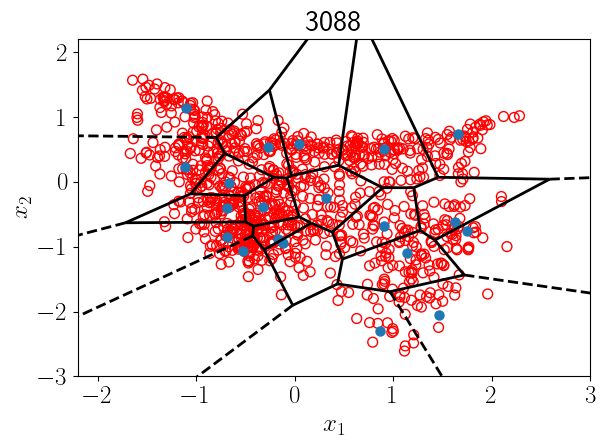

epoch: 3393, loss: 0.49382486939430237


/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  res_loc = torch.tensor(samples_x, device=latents.device, dtype=torch.float32).reshape(lat_shape)
/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  dist = torch.sqrt(torch.sum((final_samples[i,:] - torch.tensor(data, dtype=torch.float32))**2, axis=1))


Number of samples that are close to the data:  0.001


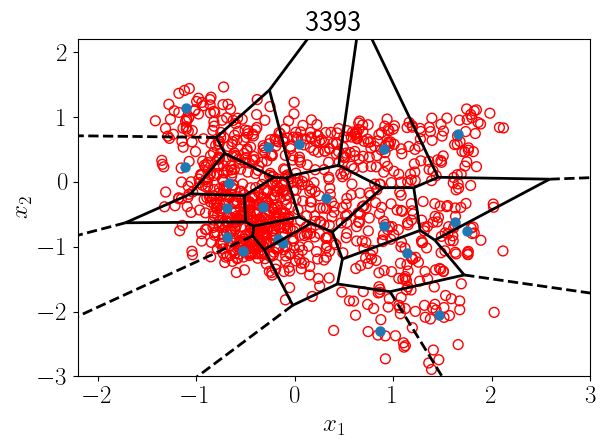

epoch: 3727, loss: 0.35745522379875183


/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  res_loc = torch.tensor(samples_x, device=latents.device, dtype=torch.float32).reshape(lat_shape)
/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  dist = torch.sqrt(torch.sum((final_samples[i,:] - torch.tensor(data, dtype=torch.float32))**2, axis=1))


Number of samples that are close to the data:  0.001


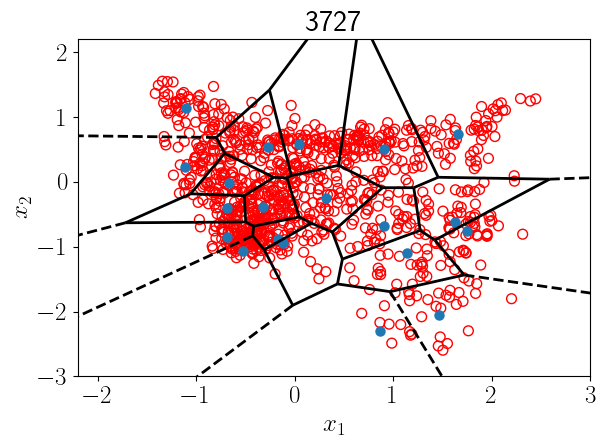

epoch: 4094, loss: 0.4516965448856354


/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  res_loc = torch.tensor(samples_x, device=latents.device, dtype=torch.float32).reshape(lat_shape)
/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  dist = torch.sqrt(torch.sum((final_samples[i,:] - torch.tensor(data, dtype=torch.float32))**2, axis=1))


Number of samples that are close to the data:  0.001


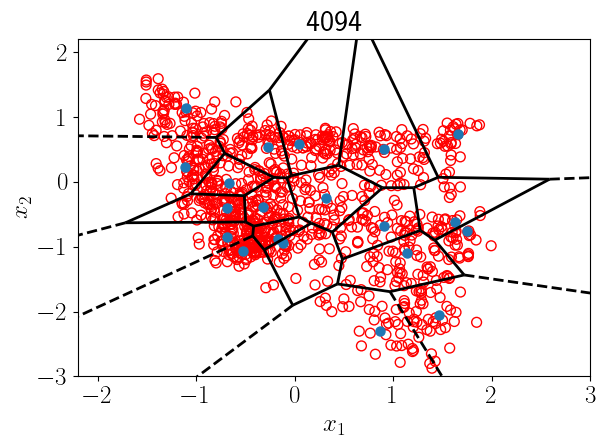

epoch: 4498, loss: 0.4734676778316498


/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  res_loc = torch.tensor(samples_x, device=latents.device, dtype=torch.float32).reshape(lat_shape)
/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  dist = torch.sqrt(torch.sum((final_samples[i,:] - torch.tensor(data, dtype=torch.float32))**2, axis=1))


Number of samples that are close to the data:  0.004


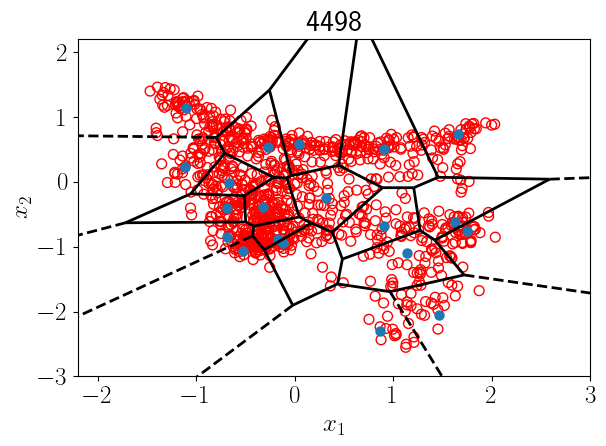

epoch: 4941, loss: 0.8138986825942993


/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  res_loc = torch.tensor(samples_x, device=latents.device, dtype=torch.float32).reshape(lat_shape)
/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  dist = torch.sqrt(torch.sum((final_samples[i,:] - torch.tensor(data, dtype=torch.float32))**2, axis=1))


Number of samples that are close to the data:  0.001


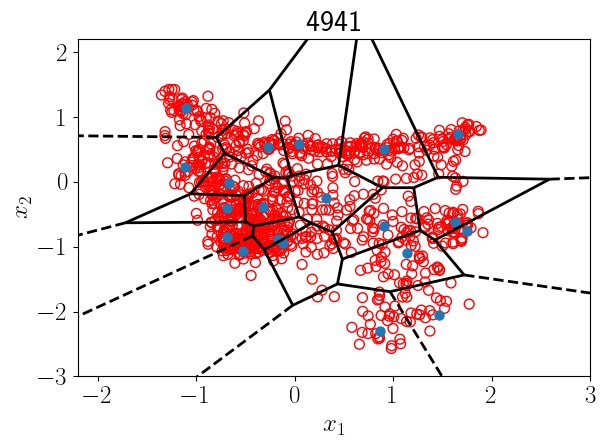

epoch: 4999, loss: 0.681000292301178


/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  res_loc = torch.tensor(samples_x, device=latents.device, dtype=torch.float32).reshape(lat_shape)
/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  dist = torch.sqrt(torch.sum((final_samples[i,:] - torch.tensor(data, dtype=torch.float32))**2, axis=1))


Number of samples that are close to the data:  0.002


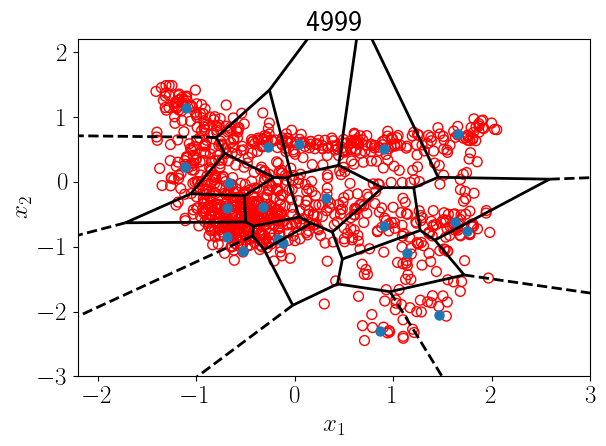

epoch: 5428, loss: 0.46786269545555115
Number of samples that are close to the data:  0.001


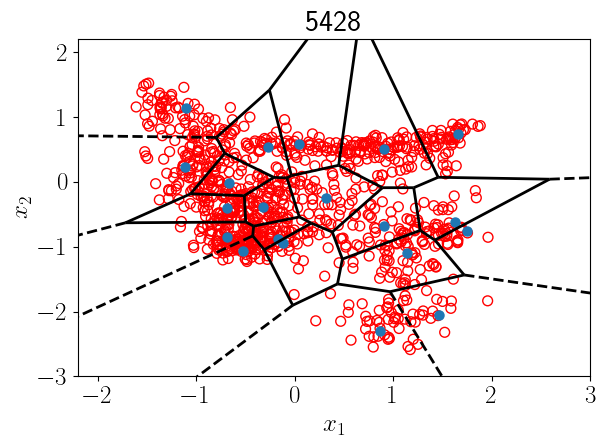

epoch: 5963, loss: 0.46891140937805176


/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  res_loc = torch.tensor(samples_x, device=latents.device, dtype=torch.float32).reshape(lat_shape)
/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  dist = torch.sqrt(torch.sum((final_samples[i,:] - torch.tensor(data, dtype=torch.float32))**2, axis=1))


Number of samples that are close to the data:  0.001


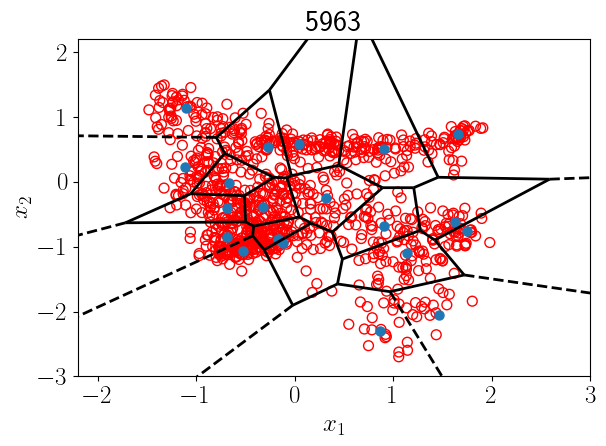

epoch: 6551, loss: 0.5278834104537964


/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  res_loc = torch.tensor(samples_x, device=latents.device, dtype=torch.float32).reshape(lat_shape)
/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  dist = torch.sqrt(torch.sum((final_samples[i,:] - torch.tensor(data, dtype=torch.float32))**2, axis=1))


Number of samples that are close to the data:  0.003


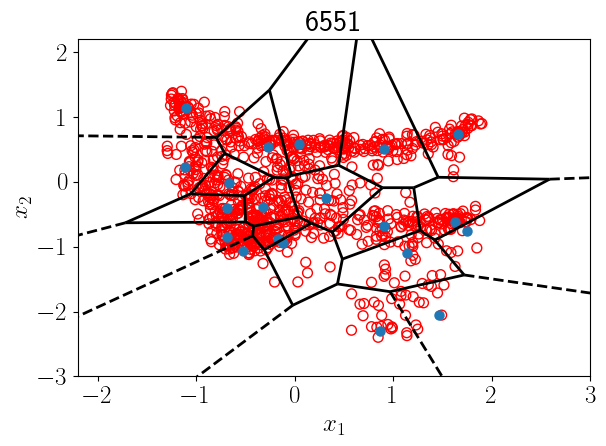

epoch: 7196, loss: 0.5862554311752319


/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  res_loc = torch.tensor(samples_x, device=latents.device, dtype=torch.float32).reshape(lat_shape)
/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  dist = torch.sqrt(torch.sum((final_samples[i,:] - torch.tensor(data, dtype=torch.float32))**2, axis=1))


Number of samples that are close to the data:  0.0


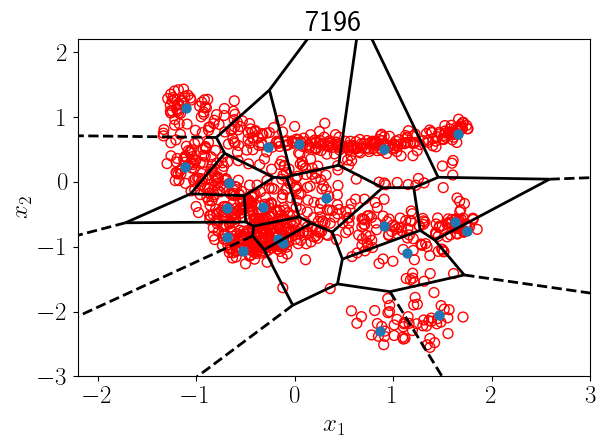

epoch: 7906, loss: 0.44302207231521606


/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  res_loc = torch.tensor(samples_x, device=latents.device, dtype=torch.float32).reshape(lat_shape)
/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  dist = torch.sqrt(torch.sum((final_samples[i,:] - torch.tensor(data, dtype=torch.float32))**2, axis=1))


Number of samples that are close to the data:  0.007


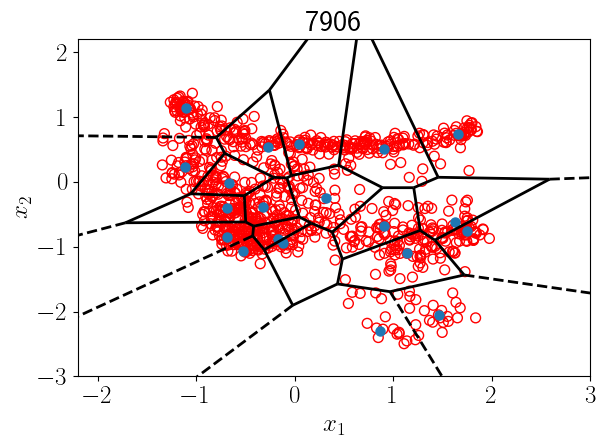

epoch: 8685, loss: 0.5148666501045227


/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  res_loc = torch.tensor(samples_x, device=latents.device, dtype=torch.float32).reshape(lat_shape)
/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  dist = torch.sqrt(torch.sum((final_samples[i,:] - torch.tensor(data, dtype=torch.float32))**2, axis=1))


Number of samples that are close to the data:  0.003


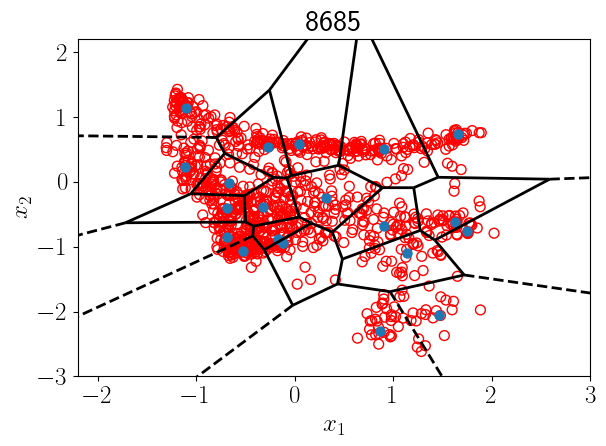

epoch: 9540, loss: 0.345603346824646


/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  res_loc = torch.tensor(samples_x, device=latents.device, dtype=torch.float32).reshape(lat_shape)
/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  dist = torch.sqrt(torch.sum((final_samples[i,:] - torch.tensor(data, dtype=torch.float32))**2, axis=1))


Number of samples that are close to the data:  0.0


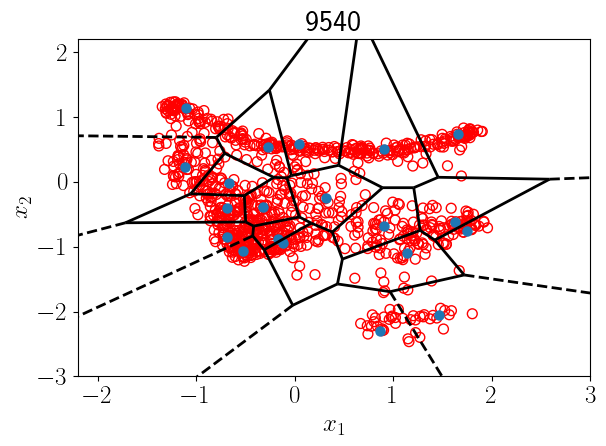

epoch: 9999, loss: 0.6753822565078735


/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  res_loc = torch.tensor(samples_x, device=latents.device, dtype=torch.float32).reshape(lat_shape)
/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  dist = torch.sqrt(torch.sum((final_samples[i,:] - torch.tensor(data, dtype=torch.float32))**2, axis=1))


Number of samples that are close to the data:  0.004


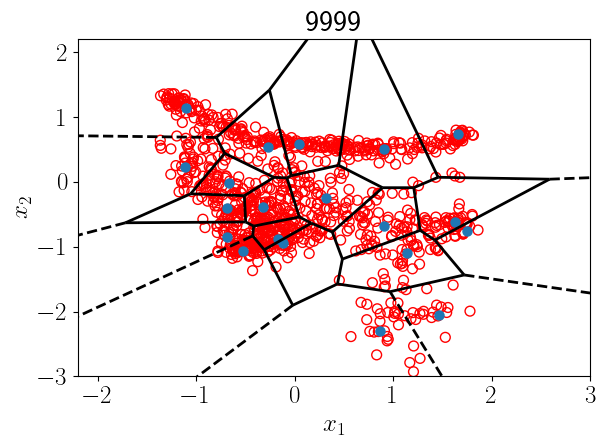

epoch: 10481, loss: 0.3791967034339905
Number of samples that are close to the data:  0.004


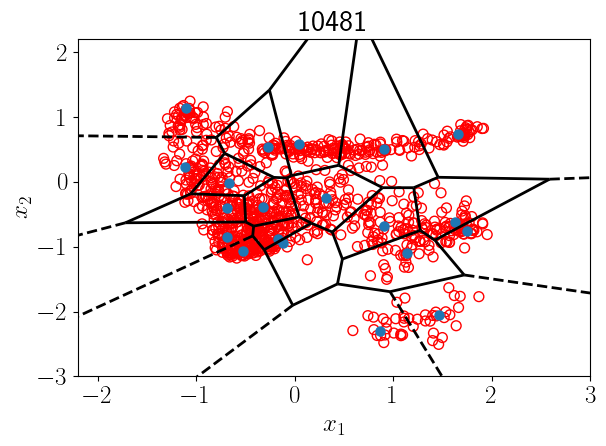

epoch: 11513, loss: 0.4509405195713043


/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  res_loc = torch.tensor(samples_x, device=latents.device, dtype=torch.float32).reshape(lat_shape)
/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  dist = torch.sqrt(torch.sum((final_samples[i,:] - torch.tensor(data, dtype=torch.float32))**2, axis=1))


Number of samples that are close to the data:  0.002


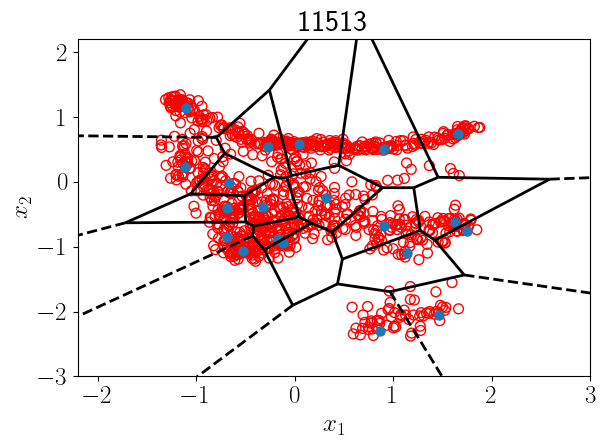

epoch: 12648, loss: 0.48316869139671326


/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  res_loc = torch.tensor(samples_x, device=latents.device, dtype=torch.float32).reshape(lat_shape)
/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  dist = torch.sqrt(torch.sum((final_samples[i,:] - torch.tensor(data, dtype=torch.float32))**2, axis=1))


Number of samples that are close to the data:  0.001


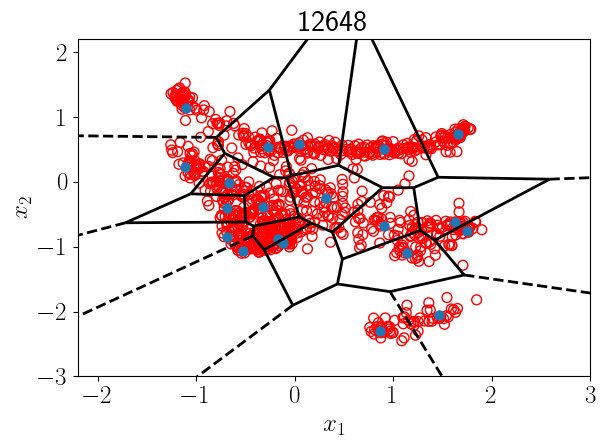

epoch: 13894, loss: 0.5350154042243958


/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  res_loc = torch.tensor(samples_x, device=latents.device, dtype=torch.float32).reshape(lat_shape)
/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  dist = torch.sqrt(torch.sum((final_samples[i,:] - torch.tensor(data, dtype=torch.float32))**2, axis=1))


Number of samples that are close to the data:  0.003


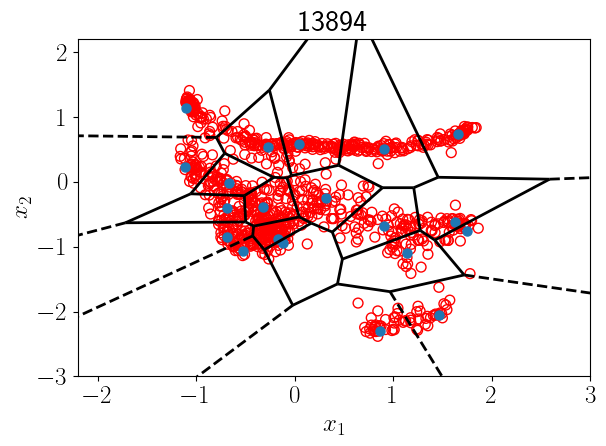

epoch: 14999, loss: 0.1892579346895218


/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  res_loc = torch.tensor(samples_x, device=latents.device, dtype=torch.float32).reshape(lat_shape)
/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  dist = torch.sqrt(torch.sum((final_samples[i,:] - torch.tensor(data, dtype=torch.float32))**2, axis=1))


Number of samples that are close to the data:  0.005


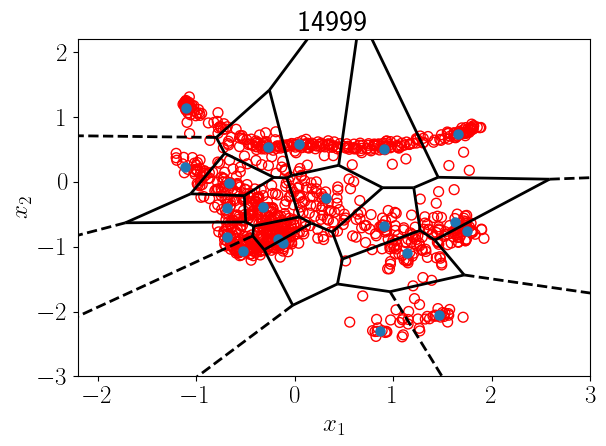

epoch: 15264, loss: 0.4557715952396393
Number of samples that are close to the data:  0.009


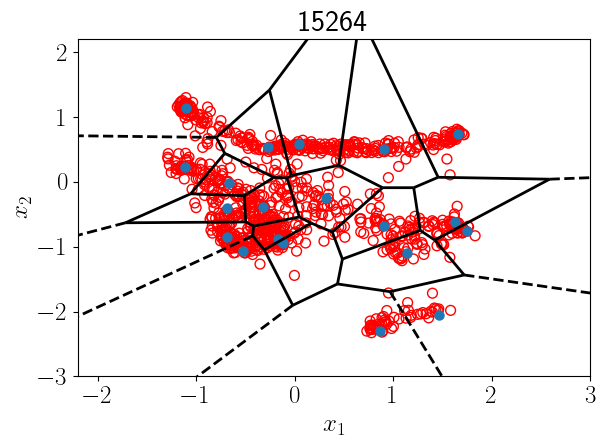

epoch: 16768, loss: 0.3293789029121399


/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  res_loc = torch.tensor(samples_x, device=latents.device, dtype=torch.float32).reshape(lat_shape)
/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  dist = torch.sqrt(torch.sum((final_samples[i,:] - torch.tensor(data, dtype=torch.float32))**2, axis=1))


Number of samples that are close to the data:  0.008


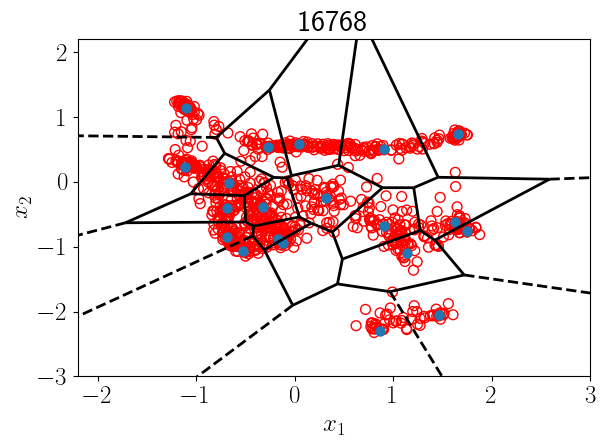

epoch: 18420, loss: 0.5209373235702515


/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  res_loc = torch.tensor(samples_x, device=latents.device, dtype=torch.float32).reshape(lat_shape)
/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  dist = torch.sqrt(torch.sum((final_samples[i,:] - torch.tensor(data, dtype=torch.float32))**2, axis=1))


Number of samples that are close to the data:  0.005


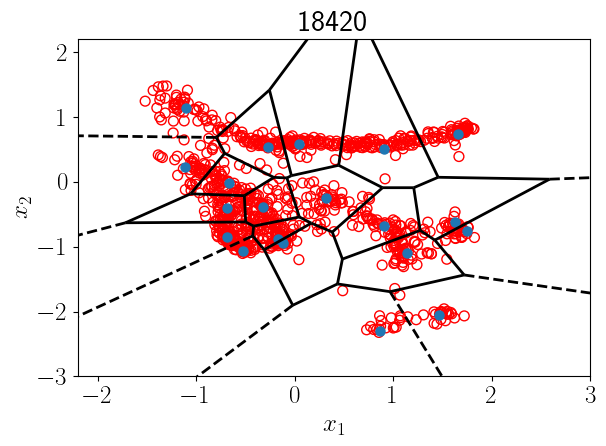

epoch: 19999, loss: 0.28377142548561096


/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  res_loc = torch.tensor(samples_x, device=latents.device, dtype=torch.float32).reshape(lat_shape)
/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  dist = torch.sqrt(torch.sum((final_samples[i,:] - torch.tensor(data, dtype=torch.float32))**2, axis=1))


Number of samples that are close to the data:  0.004


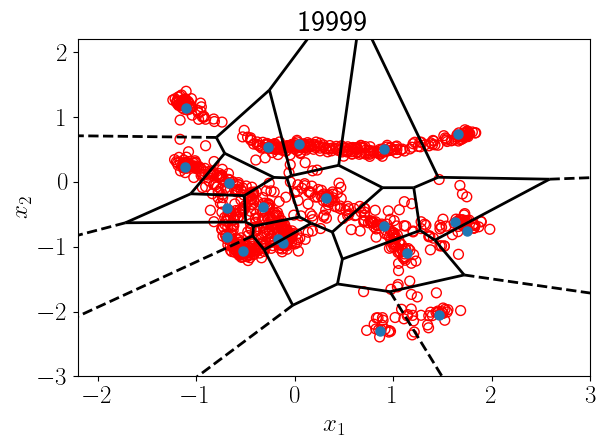

epoch: 20235, loss: 0.4120897352695465
Number of samples that are close to the data:  0.008


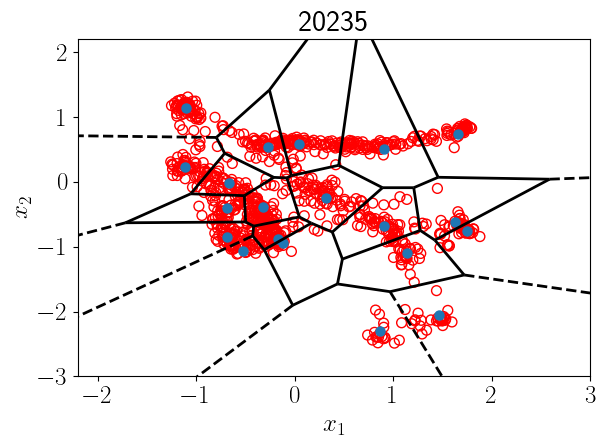

epoch: 22229, loss: 0.633540689945221


/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  res_loc = torch.tensor(samples_x, device=latents.device, dtype=torch.float32).reshape(lat_shape)
/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  dist = torch.sqrt(torch.sum((final_samples[i,:] - torch.tensor(data, dtype=torch.float32))**2, axis=1))


Number of samples that are close to the data:  0.01


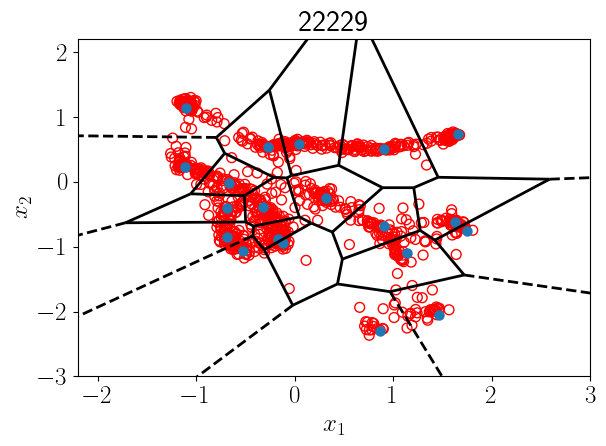

epoch: 24420, loss: 0.5505193471908569


/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  res_loc = torch.tensor(samples_x, device=latents.device, dtype=torch.float32).reshape(lat_shape)
/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  dist = torch.sqrt(torch.sum((final_samples[i,:] - torch.tensor(data, dtype=torch.float32))**2, axis=1))


Number of samples that are close to the data:  0.013


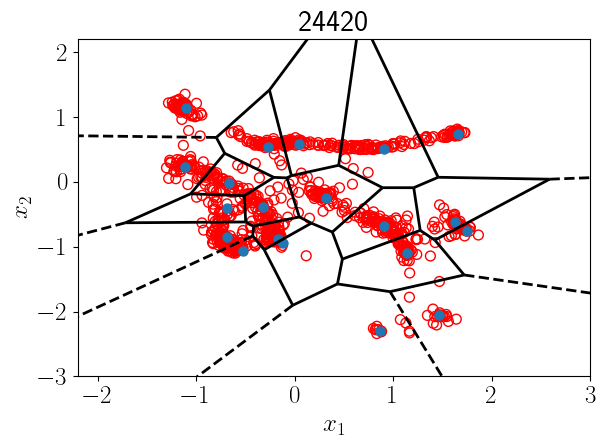

epoch: 24999, loss: 0.40182456374168396


/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  res_loc = torch.tensor(samples_x, device=latents.device, dtype=torch.float32).reshape(lat_shape)
/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  dist = torch.sqrt(torch.sum((final_samples[i,:] - torch.tensor(data, dtype=torch.float32))**2, axis=1))


Number of samples that are close to the data:  0.006


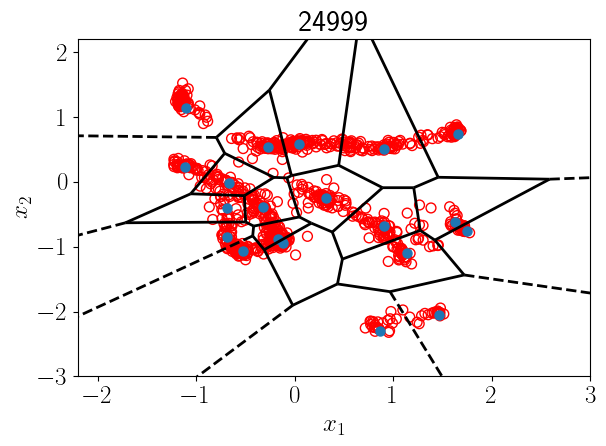

epoch: 26826, loss: 0.5313623547554016
Number of samples that are close to the data:  0.006


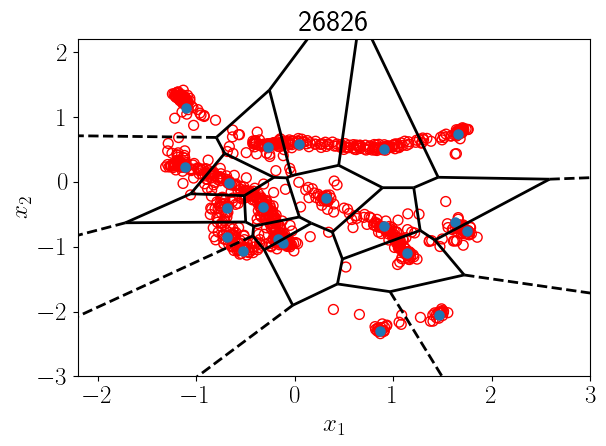

epoch: 29470, loss: 0.6561766862869263


/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  res_loc = torch.tensor(samples_x, device=latents.device, dtype=torch.float32).reshape(lat_shape)
/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  dist = torch.sqrt(torch.sum((final_samples[i,:] - torch.tensor(data, dtype=torch.float32))**2, axis=1))


Number of samples that are close to the data:  0.013


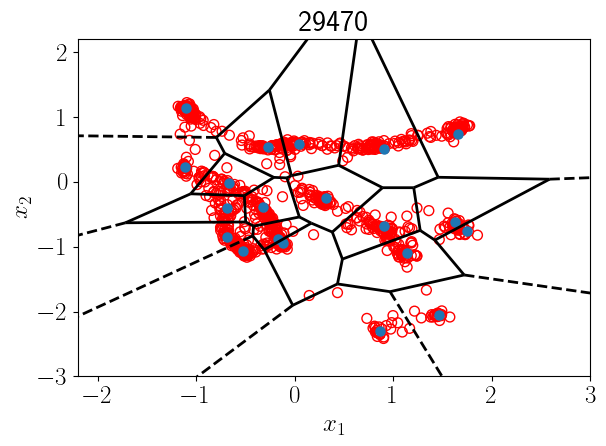

epoch: 29999, loss: 0.6528781056404114


/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  res_loc = torch.tensor(samples_x, device=latents.device, dtype=torch.float32).reshape(lat_shape)
/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  dist = torch.sqrt(torch.sum((final_samples[i,:] - torch.tensor(data, dtype=torch.float32))**2, axis=1))


Number of samples that are close to the data:  0.007


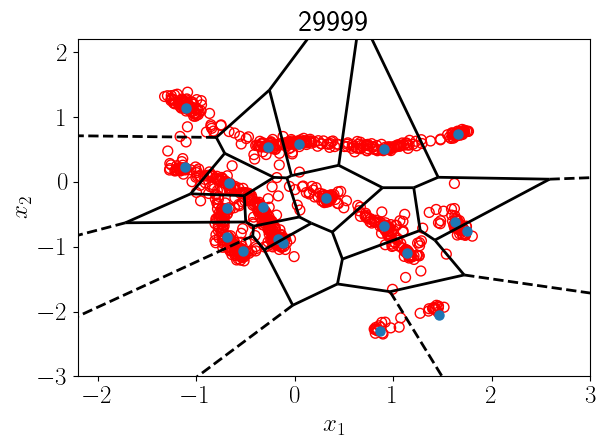

epoch: 32374, loss: 0.6349814534187317
Number of samples that are close to the data:  0.018


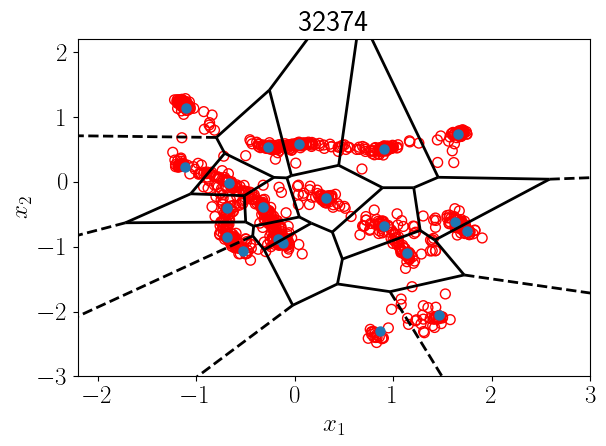

epoch: 34999, loss: 0.2683669626712799


/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  res_loc = torch.tensor(samples_x, device=latents.device, dtype=torch.float32).reshape(lat_shape)
/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  dist = torch.sqrt(torch.sum((final_samples[i,:] - torch.tensor(data, dtype=torch.float32))**2, axis=1))


Number of samples that are close to the data:  0.014


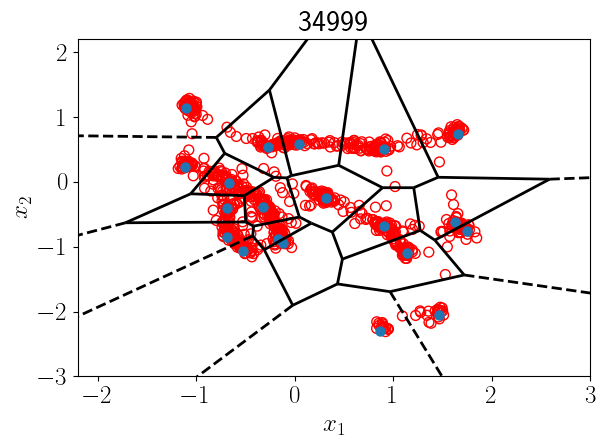

epoch: 35564, loss: 0.6080215573310852
Number of samples that are close to the data:  0.02


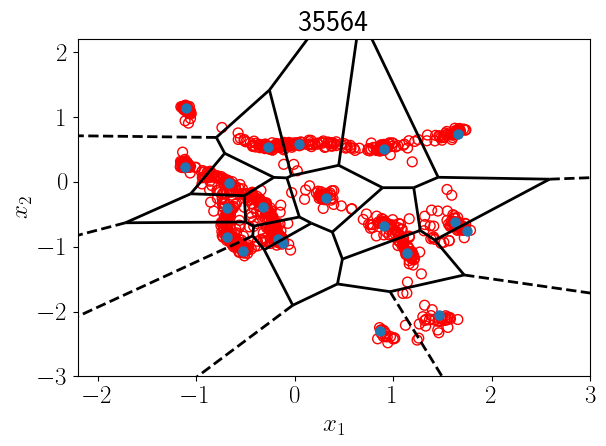

epoch: 39069, loss: 0.5144819021224976


/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  res_loc = torch.tensor(samples_x, device=latents.device, dtype=torch.float32).reshape(lat_shape)
/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  dist = torch.sqrt(torch.sum((final_samples[i,:] - torch.tensor(data, dtype=torch.float32))**2, axis=1))


Number of samples that are close to the data:  0.024


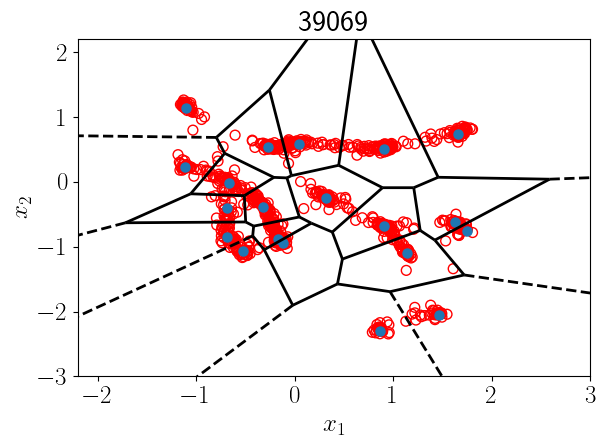

epoch: 39999, loss: 0.8390347361564636


/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  res_loc = torch.tensor(samples_x, device=latents.device, dtype=torch.float32).reshape(lat_shape)
/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  dist = torch.sqrt(torch.sum((final_samples[i,:] - torch.tensor(data, dtype=torch.float32))**2, axis=1))


Number of samples that are close to the data:  0.022


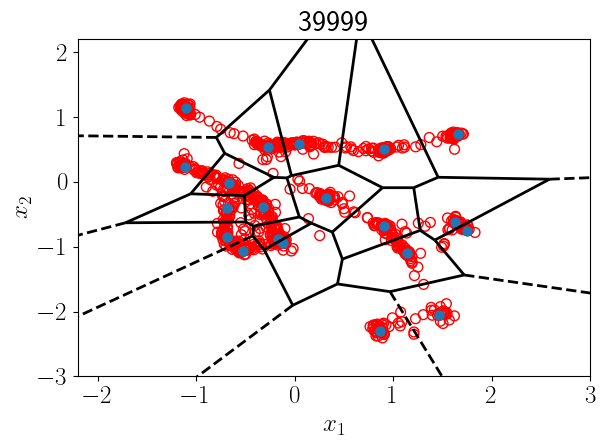

epoch: 42919, loss: 0.44136160612106323
Number of samples that are close to the data:  0.023


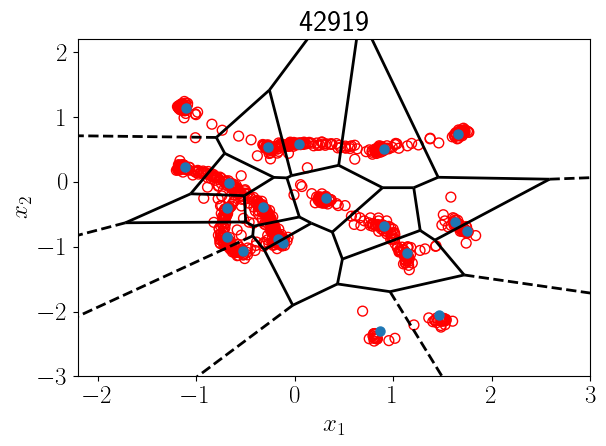

epoch: 44999, loss: 0.5657086372375488


/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  res_loc = torch.tensor(samples_x, device=latents.device, dtype=torch.float32).reshape(lat_shape)
/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  dist = torch.sqrt(torch.sum((final_samples[i,:] - torch.tensor(data, dtype=torch.float32))**2, axis=1))


Number of samples that are close to the data:  0.027


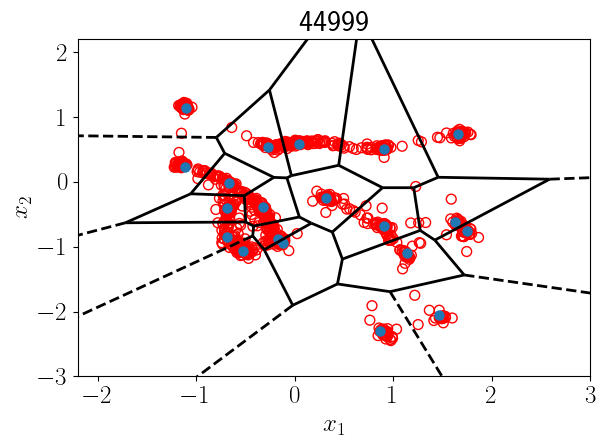

epoch: 47148, loss: 0.314403235912323
Number of samples that are close to the data:  0.023


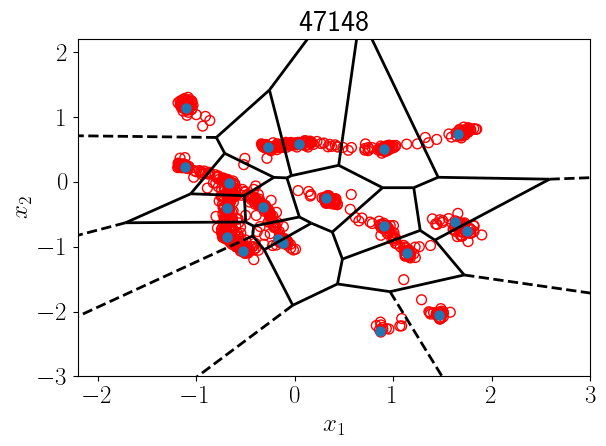

epoch: 49999, loss: 0.4536341726779938


/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  res_loc = torch.tensor(samples_x, device=latents.device, dtype=torch.float32).reshape(lat_shape)
/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  dist = torch.sqrt(torch.sum((final_samples[i,:] - torch.tensor(data, dtype=torch.float32))**2, axis=1))


Number of samples that are close to the data:  0.03


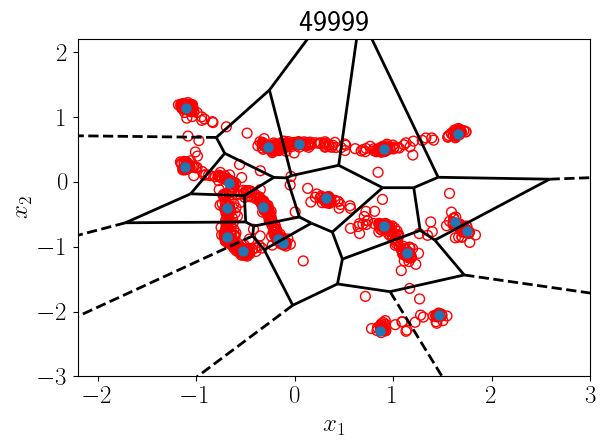

epoch: 51794, loss: 0.5678406953811646
Number of samples that are close to the data:  0.034


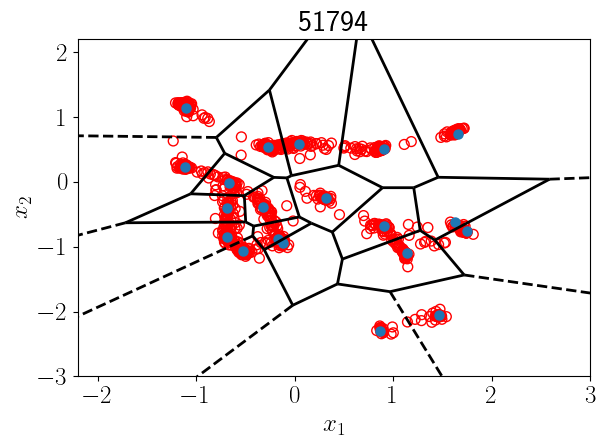

epoch: 54999, loss: 0.47514796257019043


/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  res_loc = torch.tensor(samples_x, device=latents.device, dtype=torch.float32).reshape(lat_shape)
/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  dist = torch.sqrt(torch.sum((final_samples[i,:] - torch.tensor(data, dtype=torch.float32))**2, axis=1))


Number of samples that are close to the data:  0.031


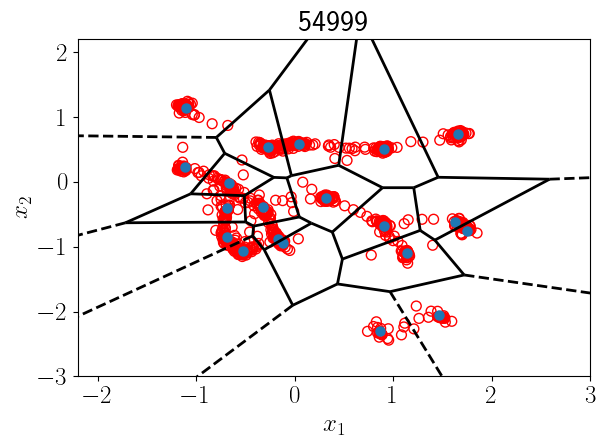

epoch: 56898, loss: 0.3962503671646118
Number of samples that are close to the data:  0.024


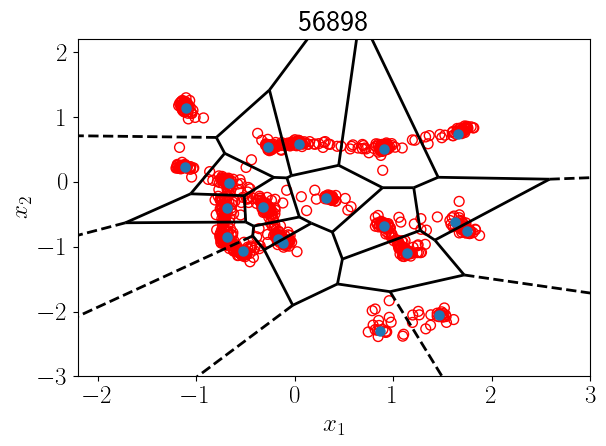

epoch: 59999, loss: 0.3346758484840393


/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  res_loc = torch.tensor(samples_x, device=latents.device, dtype=torch.float32).reshape(lat_shape)
/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  dist = torch.sqrt(torch.sum((final_samples[i,:] - torch.tensor(data, dtype=torch.float32))**2, axis=1))


Number of samples that are close to the data:  0.032


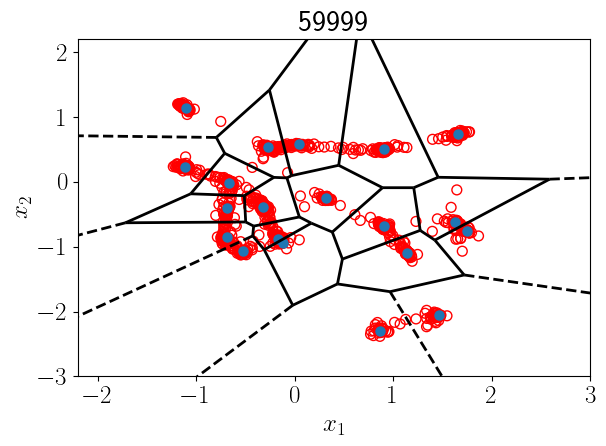

epoch: 62505, loss: 0.3969702124595642
Number of samples that are close to the data:  0.036


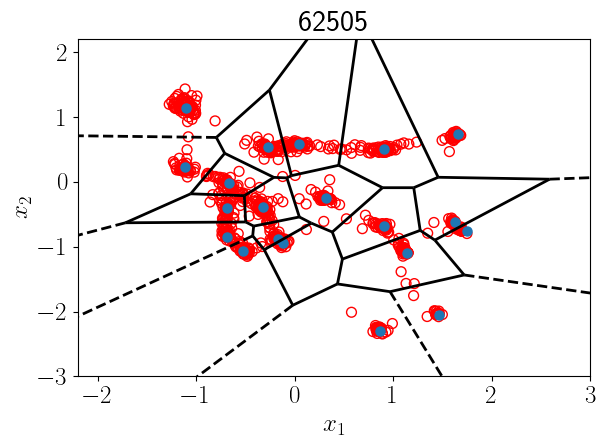

epoch: 64999, loss: 0.3795643448829651


/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  res_loc = torch.tensor(samples_x, device=latents.device, dtype=torch.float32).reshape(lat_shape)
/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  dist = torch.sqrt(torch.sum((final_samples[i,:] - torch.tensor(data, dtype=torch.float32))**2, axis=1))


Number of samples that are close to the data:  0.044


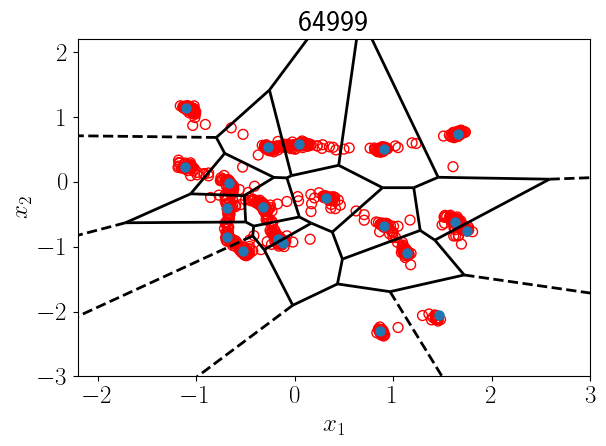

epoch: 68664, loss: 0.5254080891609192
Number of samples that are close to the data:  0.029


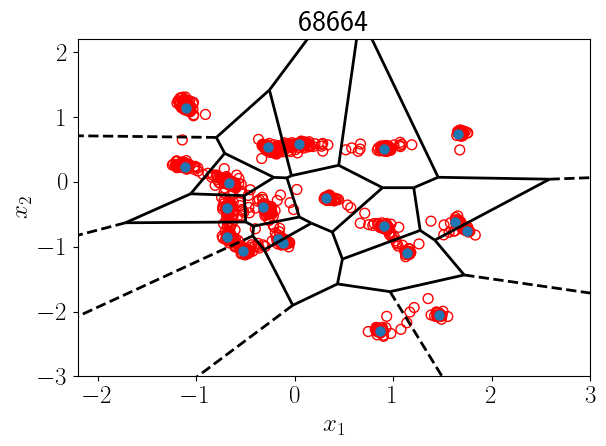

epoch: 69999, loss: 0.34626293182373047


/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  res_loc = torch.tensor(samples_x, device=latents.device, dtype=torch.float32).reshape(lat_shape)
/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  dist = torch.sqrt(torch.sum((final_samples[i,:] - torch.tensor(data, dtype=torch.float32))**2, axis=1))


Number of samples that are close to the data:  0.026


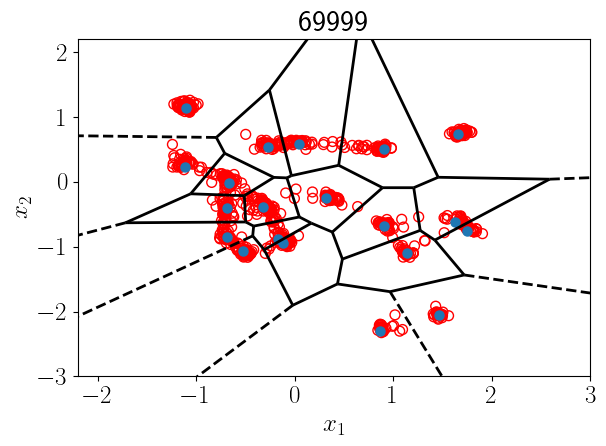

epoch: 74999, loss: 0.6416021585464478
Number of samples that are close to the data:  0.023


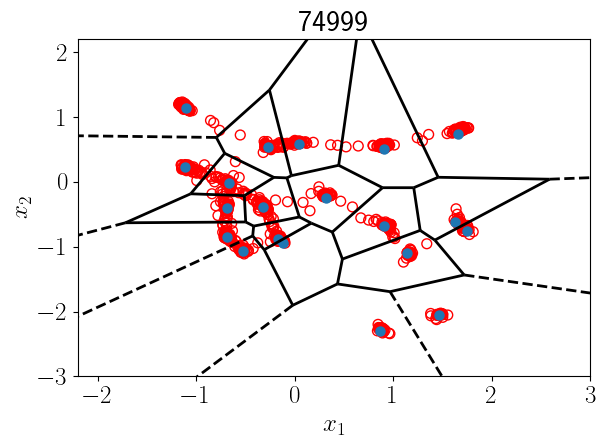

epoch: 75431, loss: 0.36366933584213257
Number of samples that are close to the data:  0.036


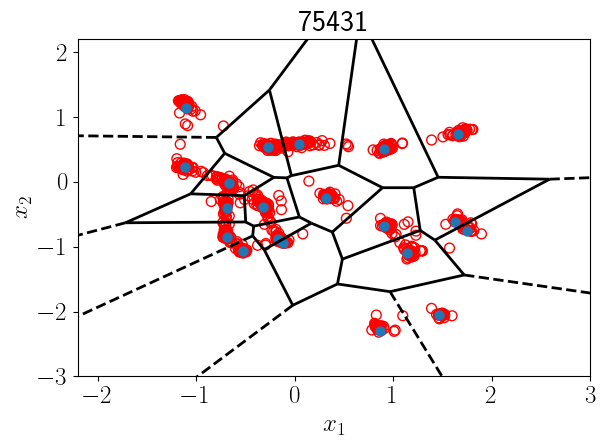

epoch: 79999, loss: 0.5181885957717896


/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  res_loc = torch.tensor(samples_x, device=latents.device, dtype=torch.float32).reshape(lat_shape)
/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  dist = torch.sqrt(torch.sum((final_samples[i,:] - torch.tensor(data, dtype=torch.float32))**2, axis=1))


Number of samples that are close to the data:  0.045


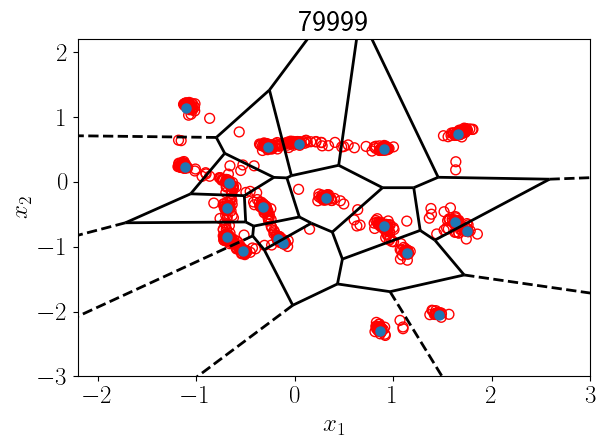

epoch: 82864, loss: 0.29884281754493713
Number of samples that are close to the data:  0.041


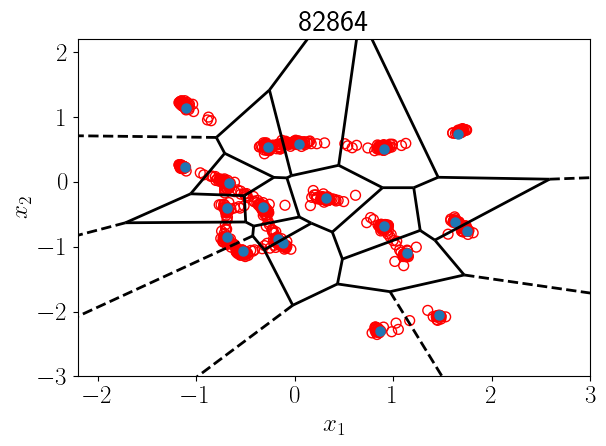

epoch: 84999, loss: 0.8221117854118347


/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  res_loc = torch.tensor(samples_x, device=latents.device, dtype=torch.float32).reshape(lat_shape)
/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  dist = torch.sqrt(torch.sum((final_samples[i,:] - torch.tensor(data, dtype=torch.float32))**2, axis=1))


Number of samples that are close to the data:  0.048


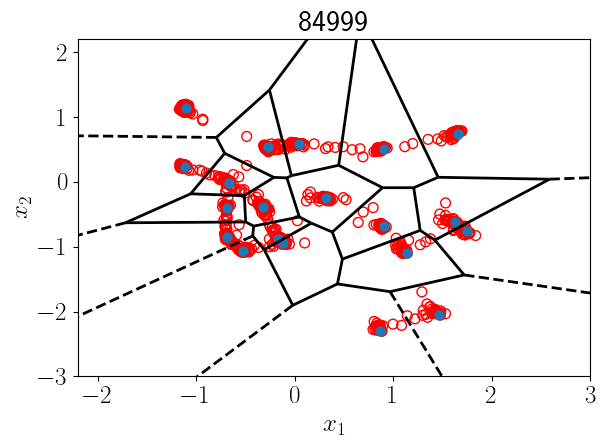

epoch: 89999, loss: 0.5386176109313965
Number of samples that are close to the data:  0.063


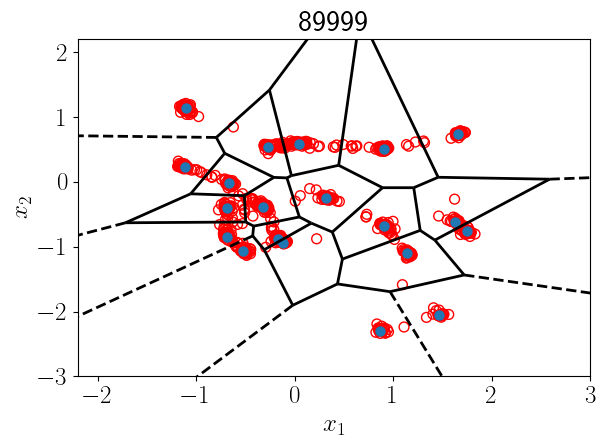

epoch: 91029, loss: 0.5490391254425049
Number of samples that are close to the data:  0.044


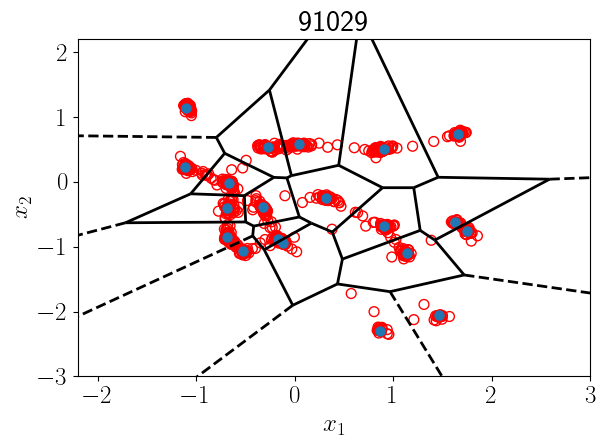

epoch: 94999, loss: 0.4341529309749603


/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  res_loc = torch.tensor(samples_x, device=latents.device, dtype=torch.float32).reshape(lat_shape)
/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  dist = torch.sqrt(torch.sum((final_samples[i,:] - torch.tensor(data, dtype=torch.float32))**2, axis=1))


Number of samples that are close to the data:  0.077


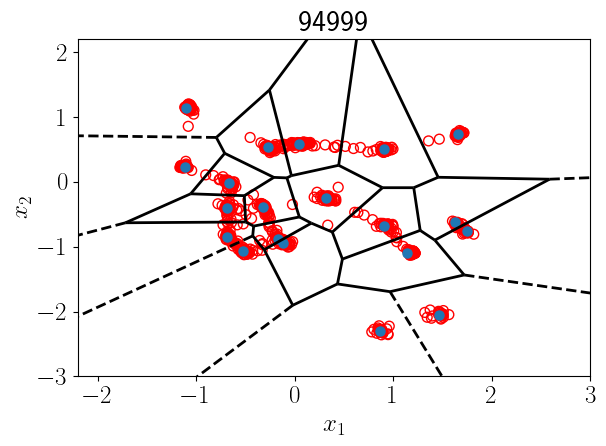

epoch: 99999, loss: 0.411942720413208
Number of samples that are close to the data:  0.072


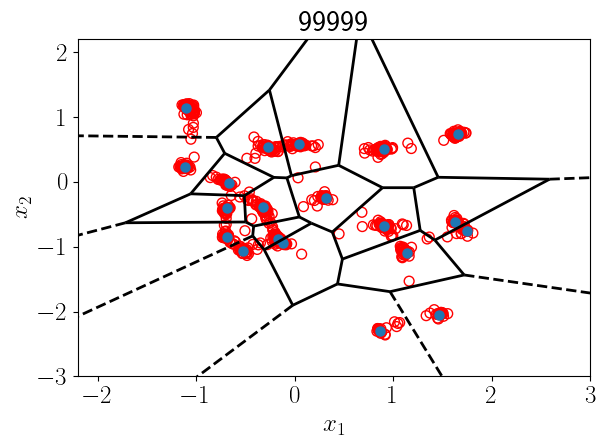

epoch: 100000, loss: 0.364173948764801
Number of samples that are close to the data:  0.067


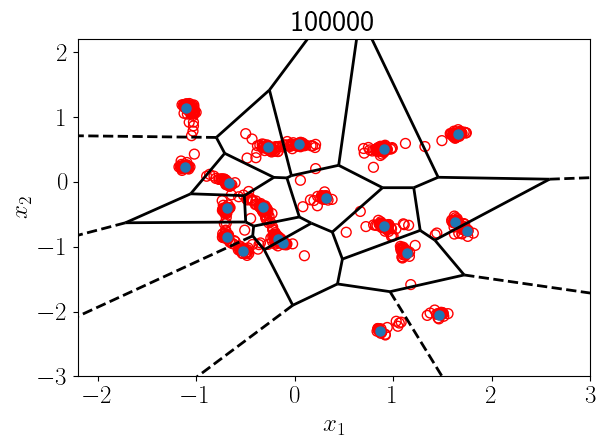

epoch: 104999, loss: 0.46561098098754883


/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  res_loc = torch.tensor(samples_x, device=latents.device, dtype=torch.float32).reshape(lat_shape)
/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_1090/1640829790.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  dist = torch.sqrt(torch.sum((final_samples[i,:] - torch.tensor(data, dtype=torch.float32))**2, axis=1))


Number of samples that are close to the data:  0.076


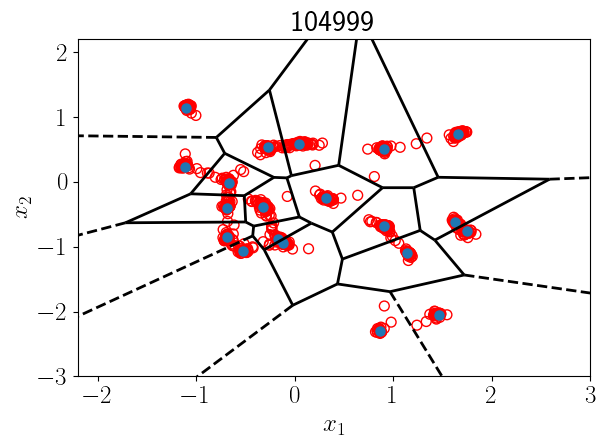

epoch: 109999, loss: 0.19988909363746643
Number of samples that are close to the data:  0.092


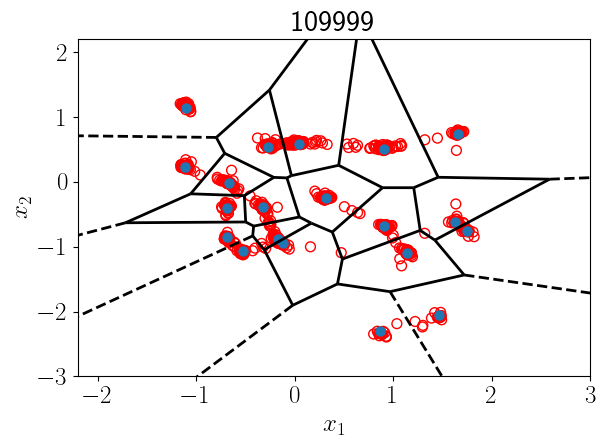

epoch: 114999, loss: 0.3076480031013489
Number of samples that are close to the data:  0.066


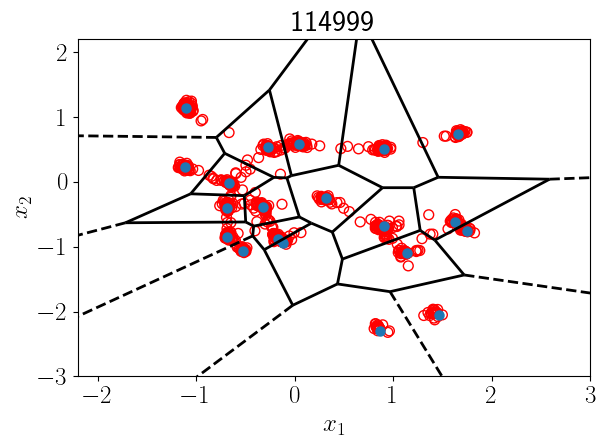

epoch: 119999, loss: 0.6123744249343872
Number of samples that are close to the data:  0.059


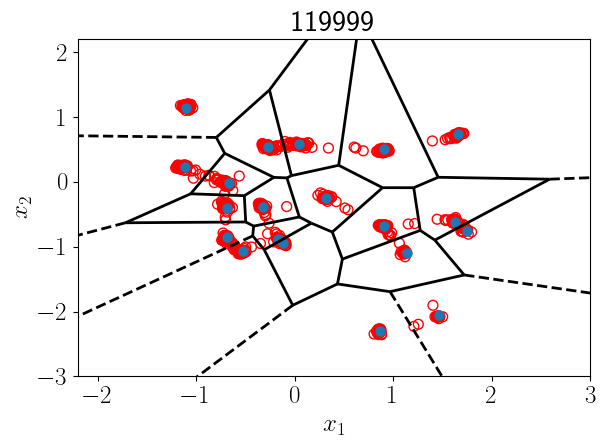

epoch: 124999, loss: 0.4040314257144928
Number of samples that are close to the data:  0.063


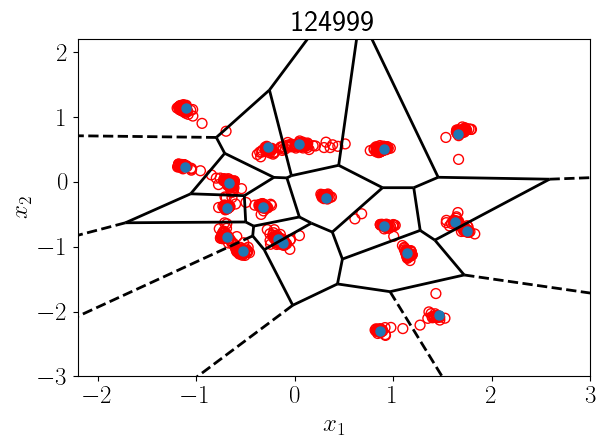

epoch: 129999, loss: 0.35618725419044495
Number of samples that are close to the data:  0.096


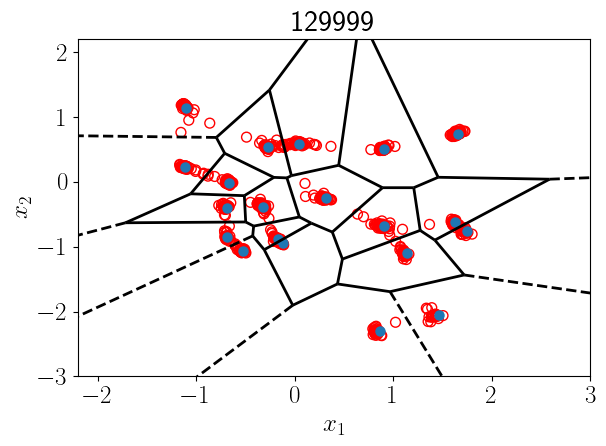

epoch: 134999, loss: 0.327029824256897
Number of samples that are close to the data:  0.111


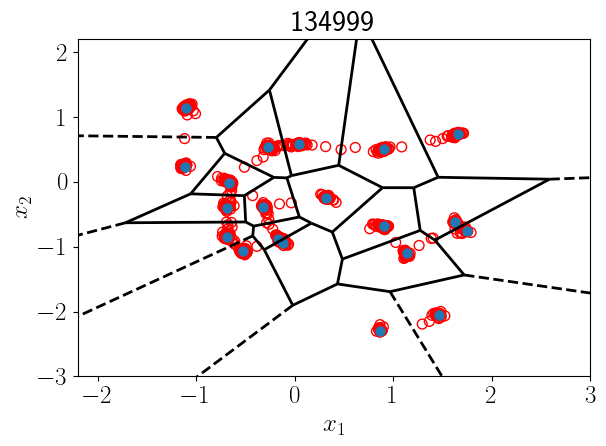

epoch: 139999, loss: 0.5374690294265747
Number of samples that are close to the data:  0.078


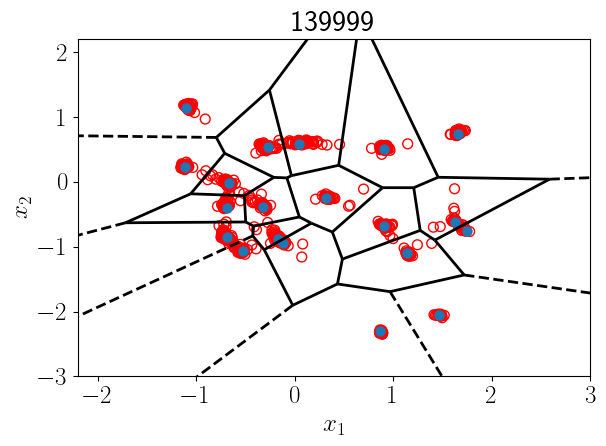

epoch: 144999, loss: 0.3571080267429352
Number of samples that are close to the data:  0.092


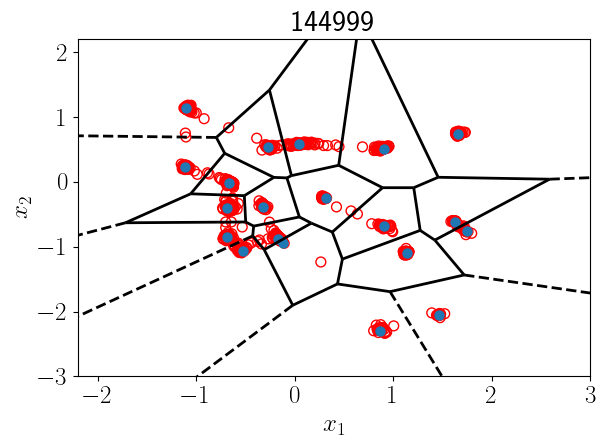

epoch: 149999, loss: 0.4118427634239197
Number of samples that are close to the data:  0.115


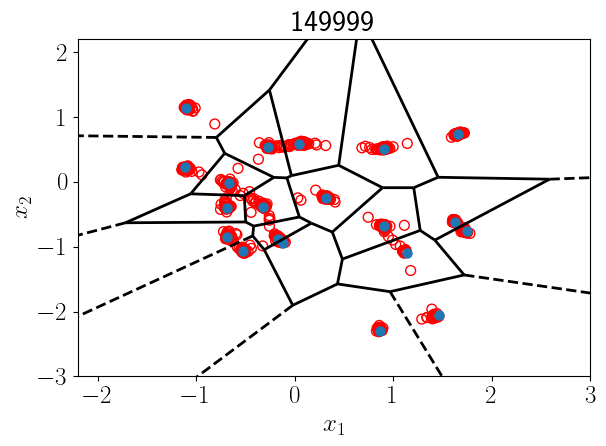

epoch: 154999, loss: 0.5245362520217896
Number of samples that are close to the data:  0.096


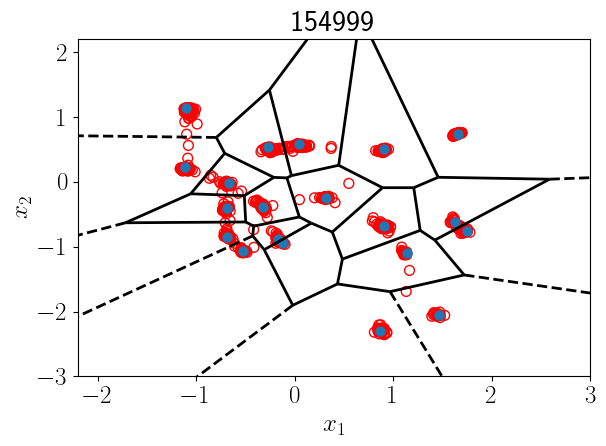

epoch: 159999, loss: 0.4299308657646179
Number of samples that are close to the data:  0.09


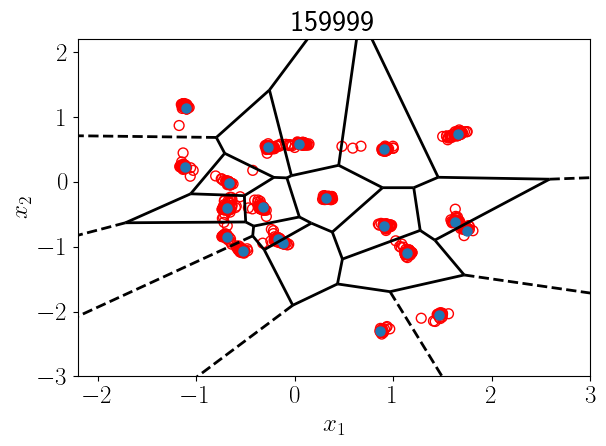

epoch: 164999, loss: 0.5298668146133423
Number of samples that are close to the data:  0.062


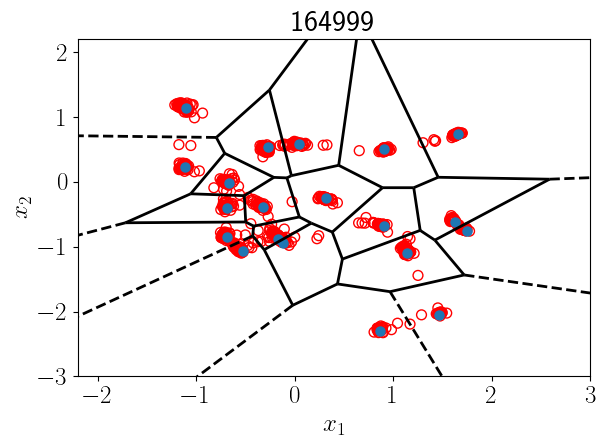

epoch: 169999, loss: 0.487257719039917
Number of samples that are close to the data:  0.076


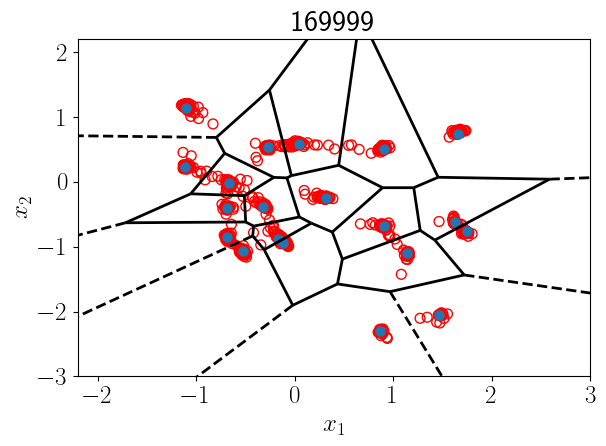

epoch: 174999, loss: 0.537584662437439
Number of samples that are close to the data:  0.115


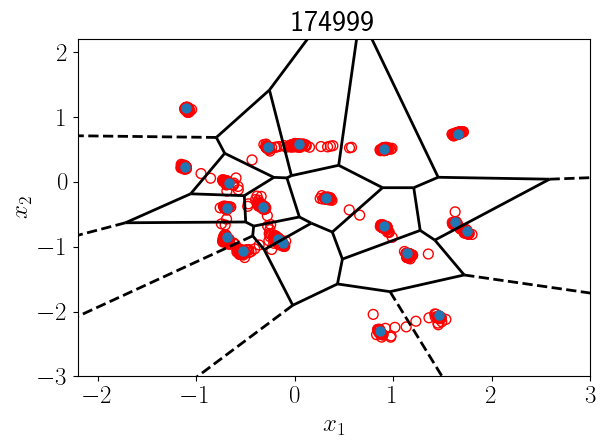

epoch: 179999, loss: 0.6051174998283386
Number of samples that are close to the data:  0.079


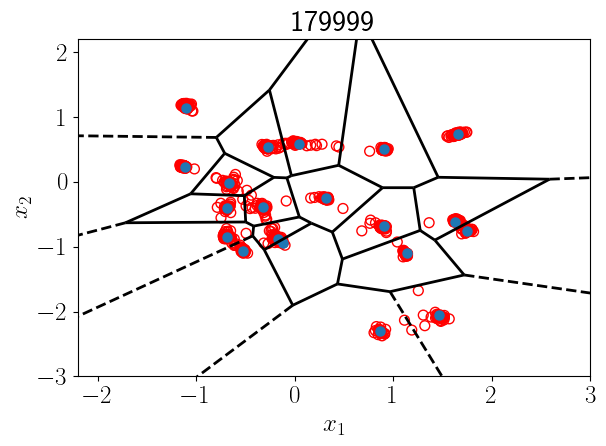

epoch: 184999, loss: 0.5369539260864258
Number of samples that are close to the data:  0.085


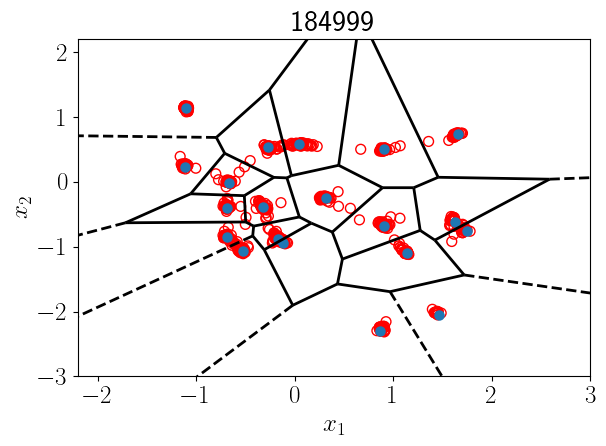

epoch: 189999, loss: 0.43320122361183167
Number of samples that are close to the data:  0.091


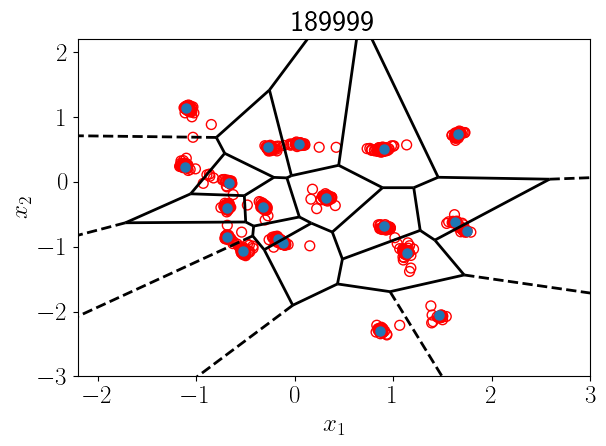

epoch: 194999, loss: 0.3783763349056244
Number of samples that are close to the data:  0.115


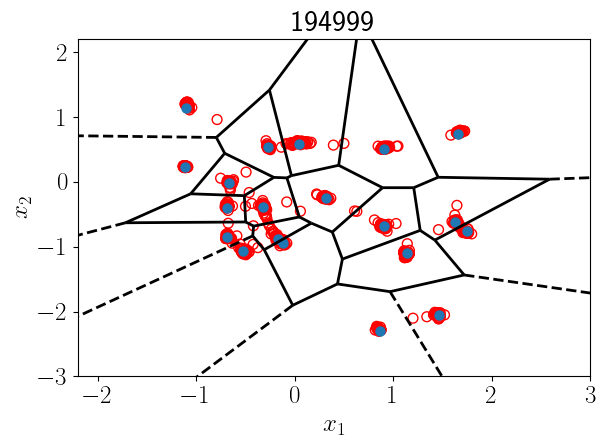

epoch: 199999, loss: 0.3745264708995819
Number of samples that are close to the data:  0.086


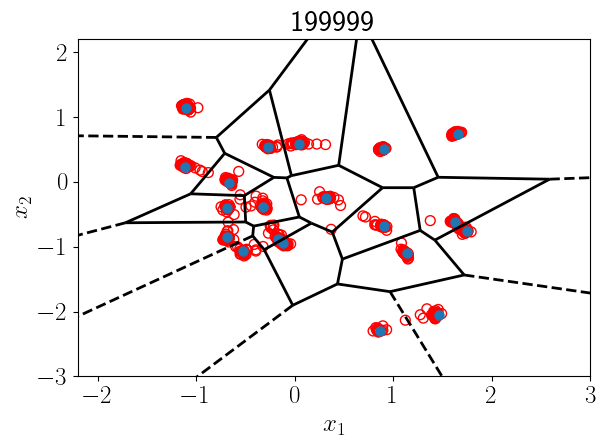

epoch: 204999, loss: 0.40762466192245483
Number of samples that are close to the data:  0.105


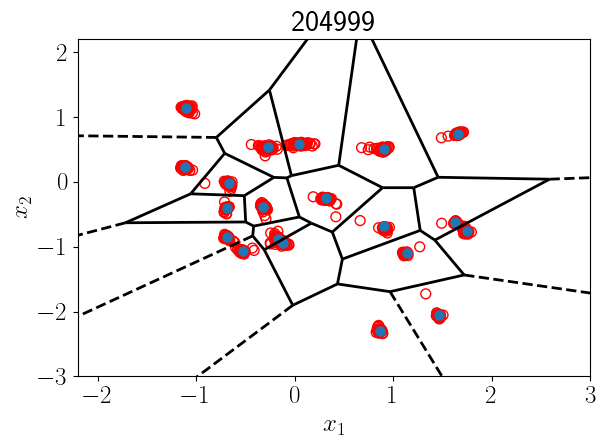

epoch: 209999, loss: 0.6579683423042297
Number of samples that are close to the data:  0.103


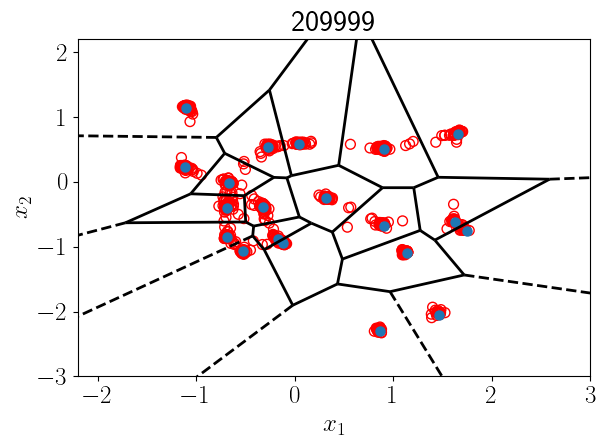

epoch: 214999, loss: 0.38069021701812744
Number of samples that are close to the data:  0.131


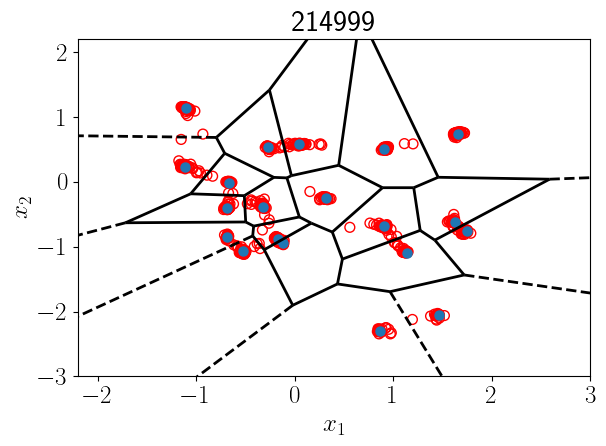

epoch: 219999, loss: 0.5116854310035706
Number of samples that are close to the data:  0.128


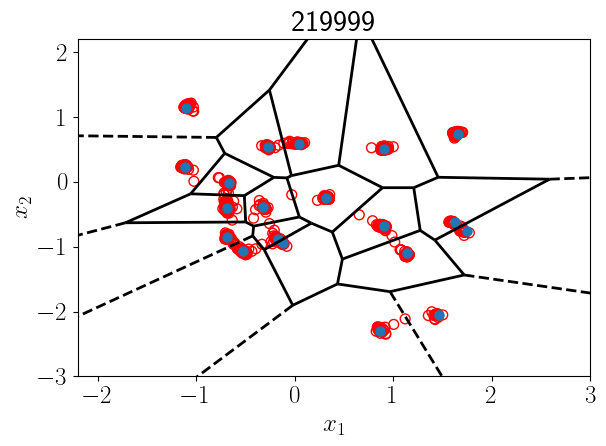

epoch: 224999, loss: 0.452446848154068
Number of samples that are close to the data:  0.105


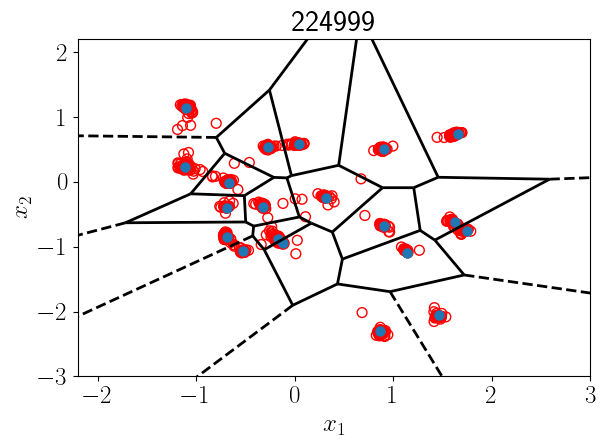

epoch: 229999, loss: 0.38795939087867737
Number of samples that are close to the data:  0.112


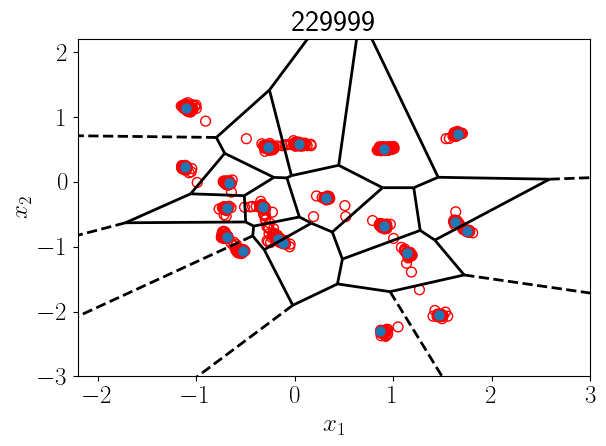

epoch: 234999, loss: 0.3996015191078186
Number of samples that are close to the data:  0.096


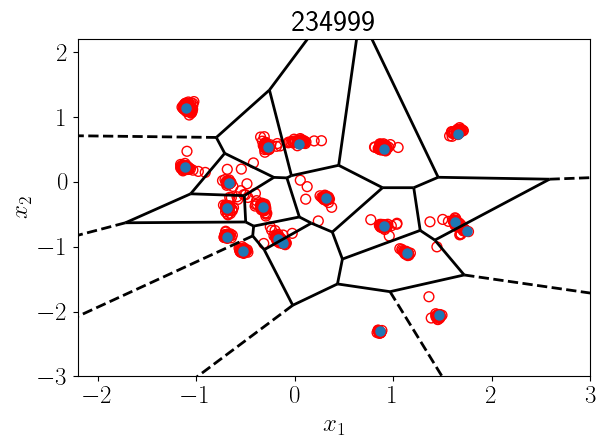

epoch: 239999, loss: 0.5592960119247437
Number of samples that are close to the data:  0.104


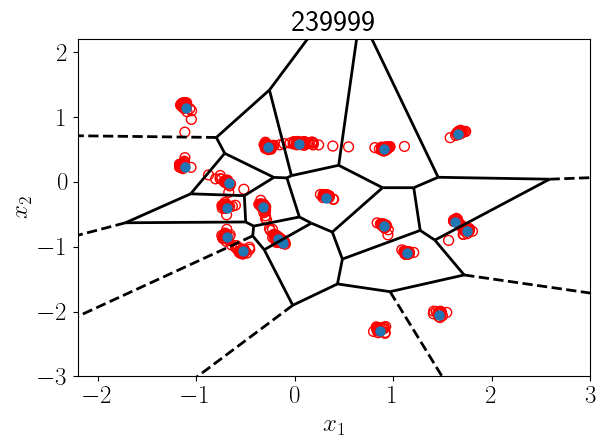

epoch: 244999, loss: 0.36735799908638
Number of samples that are close to the data:  0.112


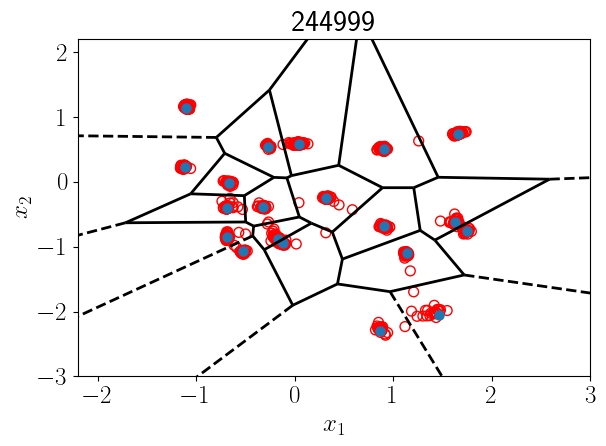

epoch: 249999, loss: 0.29654085636138916
Number of samples that are close to the data:  0.126


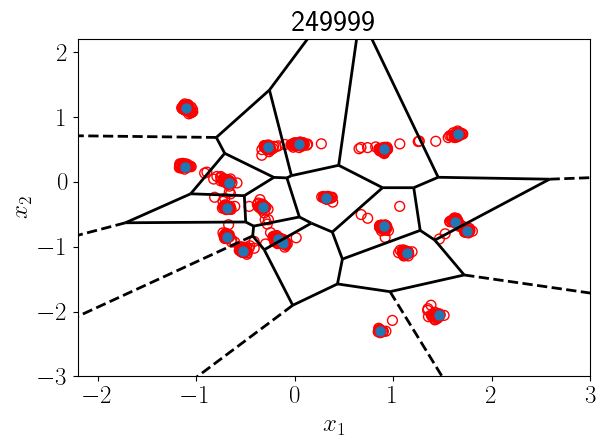

epoch: 254999, loss: 0.6364148259162903
Number of samples that are close to the data:  0.142


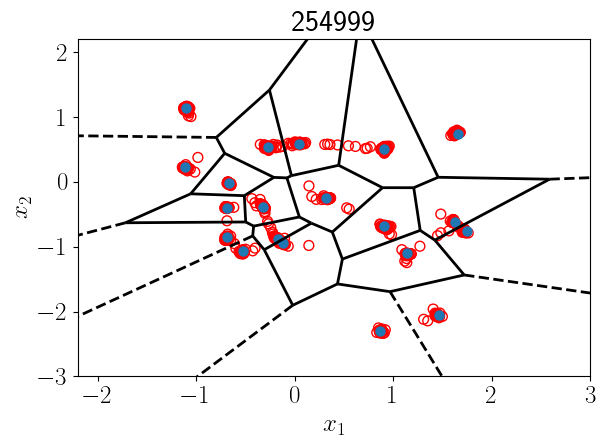

epoch: 259999, loss: 0.6152503490447998
Number of samples that are close to the data:  0.098


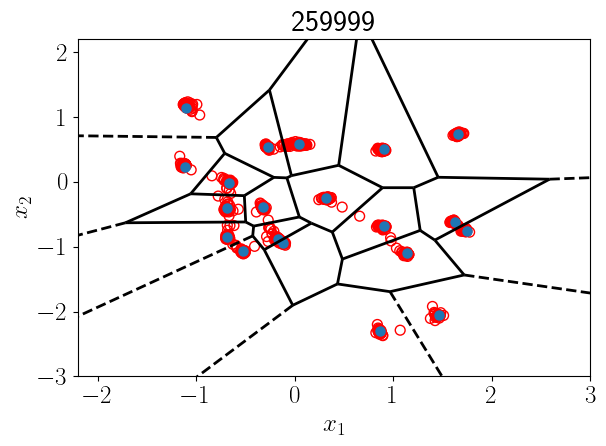

epoch: 264999, loss: 0.5759135484695435
Number of samples that are close to the data:  0.147


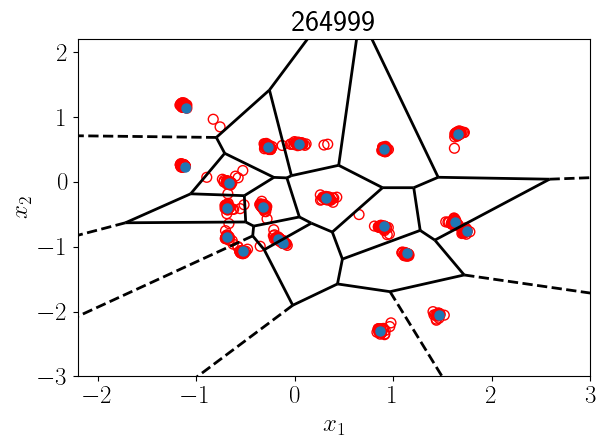

epoch: 269999, loss: 0.421370267868042
Number of samples that are close to the data:  0.12


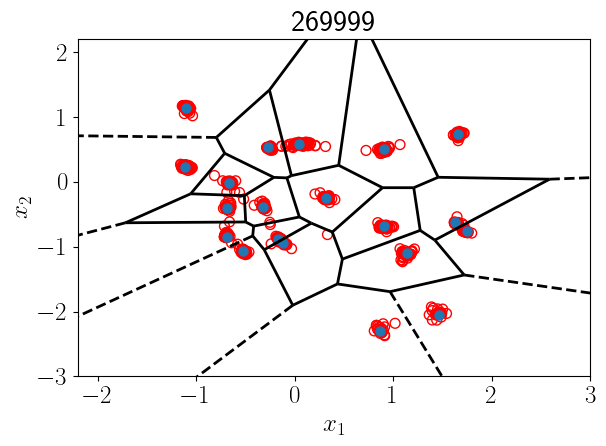

epoch: 274999, loss: 0.39027872681617737
Number of samples that are close to the data:  0.154


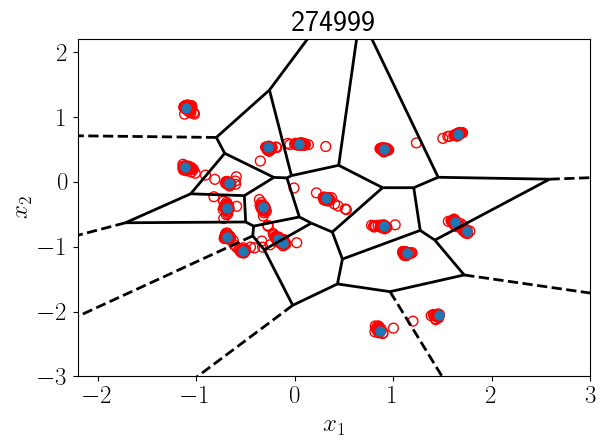

epoch: 279999, loss: 0.4826453626155853
Number of samples that are close to the data:  0.163


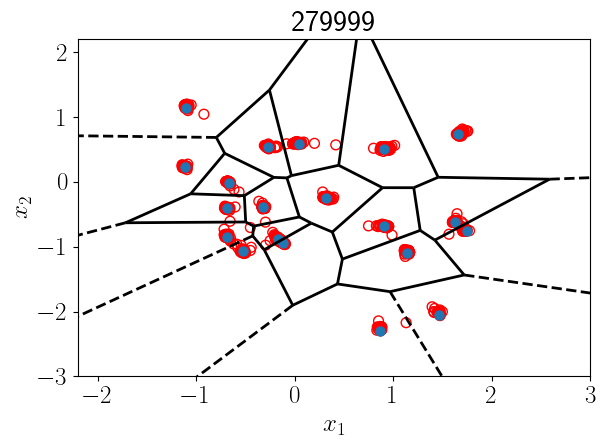

epoch: 284999, loss: 0.291190505027771
Number of samples that are close to the data:  0.112


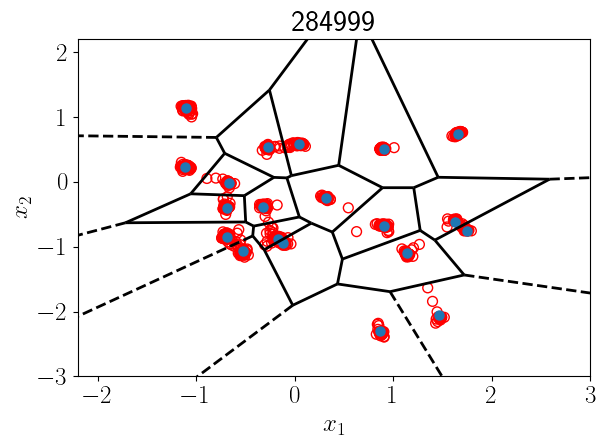

epoch: 289999, loss: 0.47749215364456177
Number of samples that are close to the data:  0.176


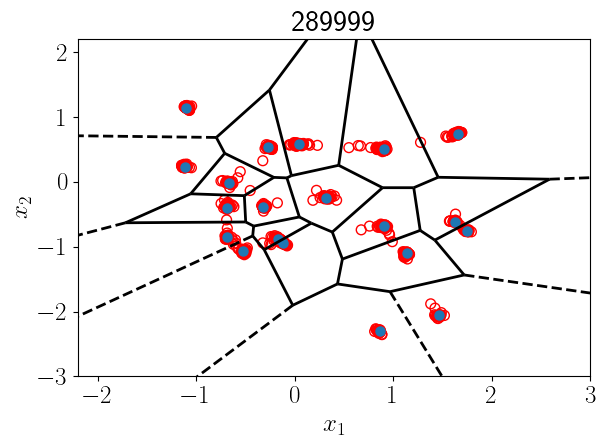

epoch: 294999, loss: 0.2861140966415405
Number of samples that are close to the data:  0.145


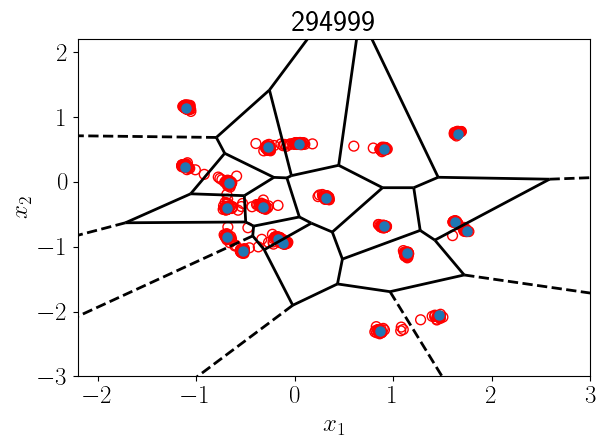

epoch: 299999, loss: 0.7554421424865723
Number of samples that are close to the data:  0.109


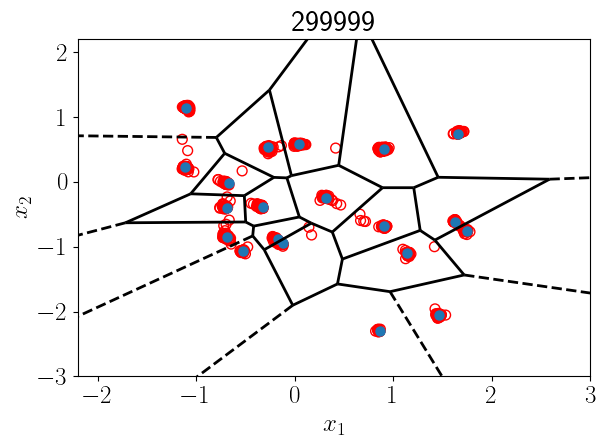

In [37]:
# Define network
score_net = score_edm(device=device, width=width, depth=depth, embed_dim=embed_dim, activation=nn.ReLU)
score_ema = EMA(score_net, beta=0.9999)

# define optimizer
optimizer = torch.optim.Adam(score_net.parameters(), lr=lr, betas=(0.9, 0.999), eps=1e-08, weight_decay=0, amsgrad=False)

# define path for saving model
if not os.path.exists(path_to_save):
    os.makedirs(path_to_save)

# define epochs for recording checkpoints
epochs_record = torch.logspace(3, 5, 50, dtype=int)

# Training loop
for epoch in range(n_epochs):
    score_net.train()

    # shuffle data
    X = data.to(device) 
    X = X[torch.randperm(X.shape[0])]

    # evaluate loss and backpropagate
    loss = loss_func(score_net, X, schedule)
    optimizer.zero_grad()
    loss.backward()

    optimizer.step()
    score_ema.update()

    # save results
    if (epoch+1) % plot_every == 0 or epoch in epochs_record:
        print("epoch: {}, loss: {}".format(epoch, loss.item()))
        states = [score_net.state_dict(),score_ema.state_dict(),optimizer.state_dict()]
        torch.save(states, path_to_save+'checkpoint_'+str(epoch)+'.pth')

## Plot generated samples

/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_54081/2115699354.py:22: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  res_loc = torch.tensor(samples_x, device=latents.device, dtype=torch.float32).reshape(lat_shape)


<Figure size 640x480 with 0 Axes>

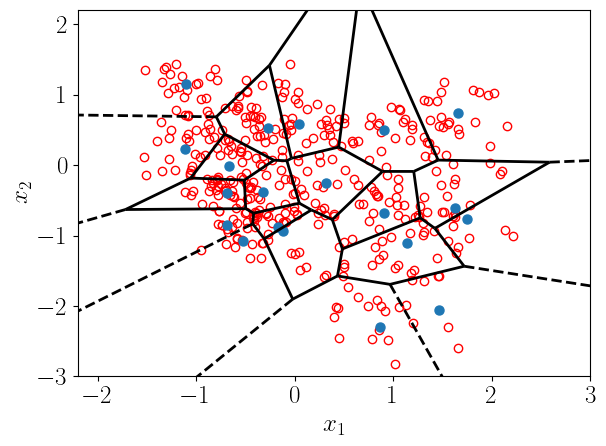

<Figure size 640x480 with 0 Axes>

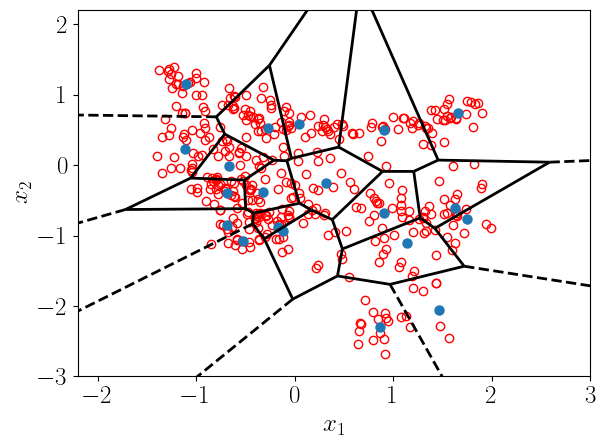

<Figure size 640x480 with 0 Axes>

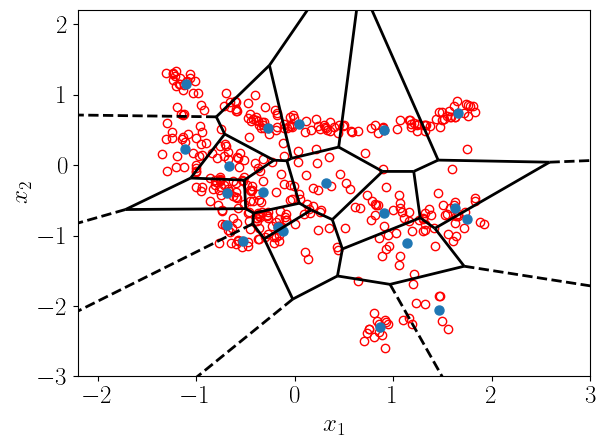

<Figure size 640x480 with 0 Axes>

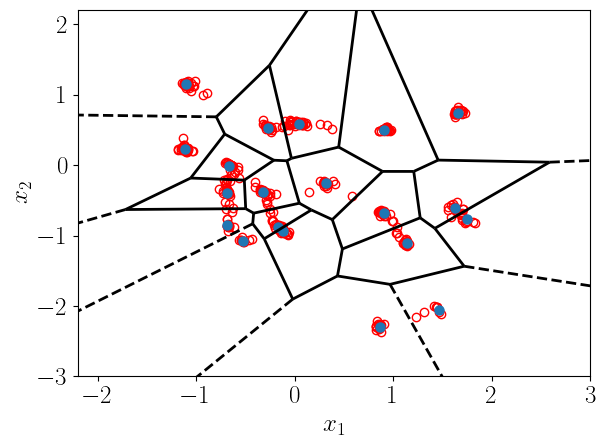

<Figure size 640x480 with 0 Axes>

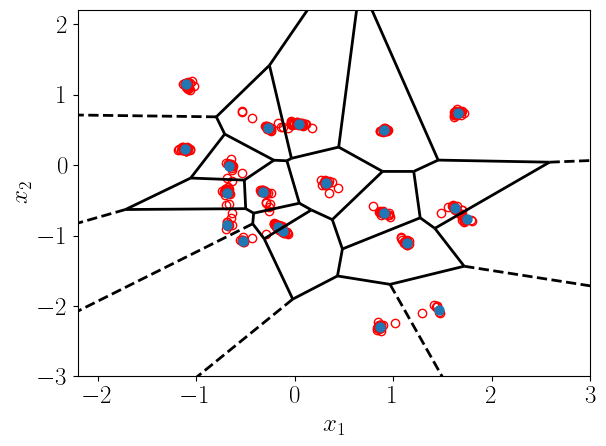

<Figure size 640x480 with 0 Axes>

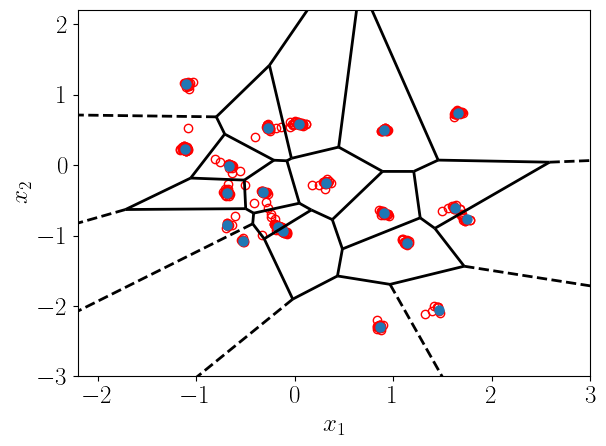

<Figure size 640x480 with 0 Axes>

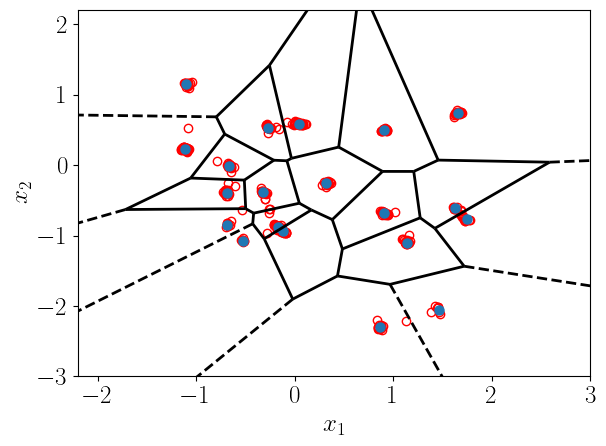

<Figure size 640x480 with 0 Axes>

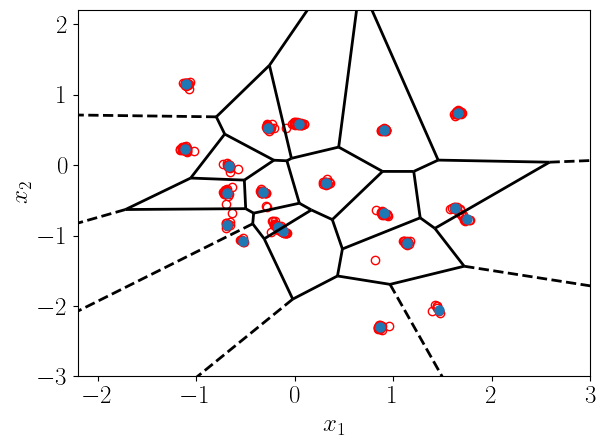

In [63]:
# define latents for sampling and integrate model
batch_size = 1000
latents = torch.randn(batch_size, dim)

# define epochs for plotting
plot_epochs = [4999, 9999, 14999, 99999, 149999, 199999, 249999, 299999]

# define points for plotting
plotting_pts = 400

# Define network
score_net = score_edm(device=device, width=width, depth=depth, embed_dim=embed_dim, activation=nn.ReLU)
score_ema = EMA(score_net, beta=0.9999)

for (k,epoch) in enumerate(plot_epochs):
    # load model
    score_ema.load_state_dict(torch.load(path_to_save+'checkpoint_'+str(epoch)+'.pth')[1])
    # integrate model
    samples_t, samples_x = schedule.ODEsampler(score_ema, latents, T0=1.0, T1=0.)
    # extract final samples
    lat_shape = [batch_size, 2, len(samples_t)]
    res_loc = torch.tensor(samples_x, device=latents.device, dtype=torch.float32).reshape(lat_shape)
    final_samples = res_loc[:,:,-1]
    # plot generated samples
    plt.figure()
    fig = voronoi_plot_2d(vor, show_vertices=False, line_width=2, point_size=13)
    plt.plot(final_samples[:plotting_pts,0], final_samples[:plotting_pts,1], 'or', mfc='none', zorder=0)
    plt.xlabel('$x_1$')
    plt.ylabel('$x_2$')
    plt.xlim(-2.2,3)
    plt.ylim(-3,2.2)
    plt.tight_layout()
    plt.savefig(figures_path+'finalpoints_epoch_'+str(epoch)+'.pdf')


## Plot the fraction of points collapsing to data

[  1000   1098   1206   1325   1456   1599   1757   1930   2120   2329
   2559   2811   3088   3393   3727   4094   4498   4941   5428   5963
   6551   7196   7906   8685   9540  10481  11513  12648  13894  15264
  16768  18420  20235  22229  24420  26826  29470  32374  35564  39069
  42919  47148  51794  56898  62505  68664  75431  82864  91029 100000
   4999   9999  14999  19999  24999  29999  34999  39999  44999  49999
  54999  59999  64999  69999  74999  79999  84999  89999  94999  99999
 104999 109999 114999 119999 124999 129999 134999 139999 144999 149999
 154999 159999 164999 169999 174999 179999 184999 189999 194999 199999
 204999 209999 214999 219999 224999 229999 234999 239999 244999 249999
 254999 259999 264999 269999 274999 279999 284999 289999 294999 299999]
[  1000   1098   1206   1325   1456   1599   1757   1930   2120   2329
   2559   2811   3088   3393   3727   4094   4498   4941   4999   5428
   5963   6551   7196   7906   8685   9540   9999  10481  11513  12648
  138

/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_54081/4244503551.py:28: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  res_loc = torch.tensor(samples_x, device=latents.device, dtype=torch.float32).reshape(lat_shape)
/var/folders/tc/106jyy157sv7rxwtk7hgpqf00000gn/T/ipykernel_54081/4244503551.py:34: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  dist = torch.sqrt(torch.sum((final_samples[i,:] - torch.tensor(data, dtype=torch.float32))**2, axis=1))


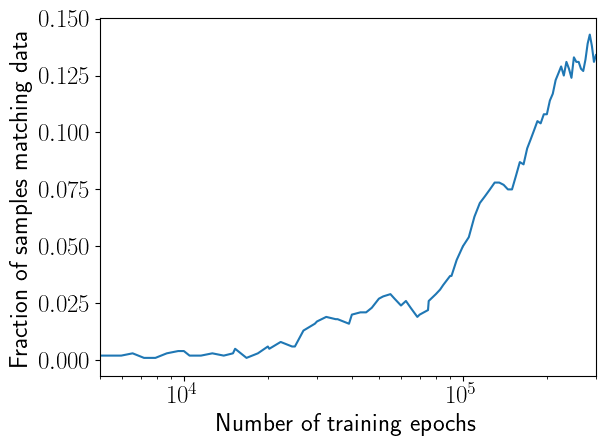

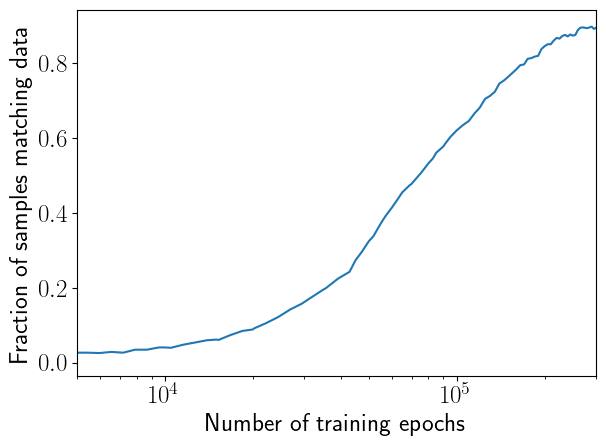

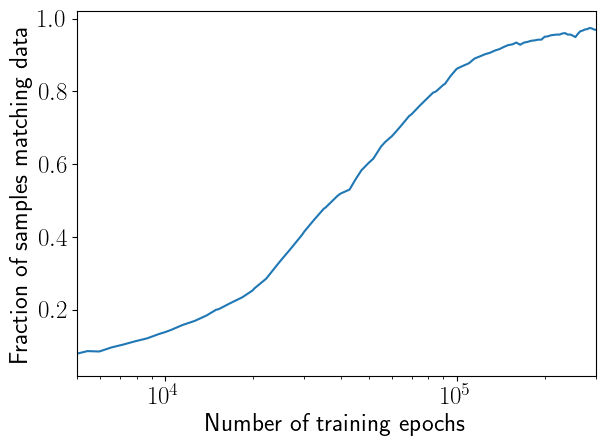

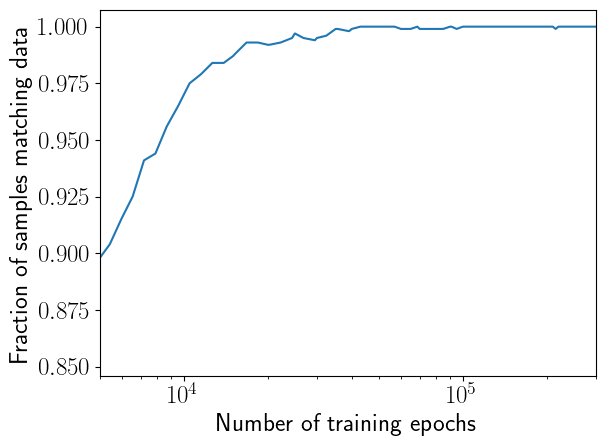

In [55]:
# define tolerances
tol_list = [1e-2, 5e-2, 1e-1, 5e-1]

# define epochs for checking collapse
all_epochs = np.logspace(3, 5, 50, dtype=int)
all_epochs = np.concatenate((all_epochs, np.arange(plot_every-1, n_epochs, plot_every)))
all_epochs = np.sort(all_epochs)

# define points for plotting
plotting_pts = 400

# define array to store counts
count_data = np.zeros((len(tol_list), len(all_epochs)))

# Define network
score_net = score_edm(device=device, width=width, depth=depth, embed_dim=embed_dim, activation=nn.ReLU)
score_ema = EMA(score_net, beta=0.9999)

for (k,epoch) in enumerate(all_epochs):
    # load model
    score_ema.load_state_dict(torch.load(path_to_save+'checkpoint_'+str(epoch)+'.pth')[1])
    # integrate model
    samples_t, samples_x = schedule.ODEsampler(score_ema, latents, T0=1.0, T1=0.)
    # extract final samples
    lat_shape = [batch_size, 2, len(samples_t)]
    res_loc = torch.tensor(samples_x, device=latents.device, dtype=torch.float32).reshape(lat_shape)
    final_samples = res_loc[:,:,-1]
    # check how close each point is to a data point
    for (j,tolerance) in enumerate(tol_list):
        count = 0
        for i in range(batch_size):
            dist = torch.sqrt(torch.sum((final_samples[i,:] - torch.tensor(data, dtype=torch.float32))**2, axis=1))
            if torch.min(dist) < tolerance:
                count += 1
        count_data[j,k] = count/batch_size

for (j,tolerance) in enumerate(tol_list):
    plt.figure()
    plt.semilogx(all_epochs, count_data[j,:], '-')
    plt.xlabel(r'Number of training epochs')
    plt.xlim([plot_every,n_epochs])
    plt.ylabel(r'Fraction of samples matching data')
    plt.tight_layout()
    plt.savefig(figures_path+'epoch_tol'+str(tolerance)+'.pdf')

In [64]:
# Check pairwise distance between generated samples
pw_dist = np.zeros(data.shape[0])
for i in range(data.shape[0]):
    pw_dist[i] = np.min(np.linalg.norm(data[np.arange(data.shape[0]) != i,:] - data[i,:], axis=1))

# compute minimum pairwise distance
print(np.min(pw_dist))
# compute median pairwise distance
print(np.mean(pw_dist))

0.07620826363563538
0.43758776485919954
